### Import Libraries

In [1]:
from util_comp import *

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import warnings

from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier

from sklearn.inspection import PartialDependenceDisplay # display partial dependence plots
from sklearn.inspection import partial_dependence # calculate partial dependence

from sklearn.metrics import accuracy_score, confusion_matrix

# Ignore warnings
warnings.filterwarnings('ignore')

# Makes sure we see all columns
pd.set_option('display.max_columns', None)

### Load (Processed) Data

In [2]:
df = main(retained=True)
df.shape

Only retained columns are used
Shape of data: (44535, 72)
Elapsed time to compute age categorisation: 0 minutes and 0 seconds
Elapsed time to compute load column names: 0 minutes and 0 seconds
Elapsed time to compute clean data: 0 minutes and 0 seconds
Elapsed time to compute categorisation of outcome column: 0 minutes and 3 seconds
Elapsed time to compute change values in catagorical columns: 1 minutes and 21 seconds
Elapsed time to compute Full process: 1 minutes and 25 seconds


(23239, 67)

In [3]:
df.head(5)

,Gender,Age,Work type,sector,size of business,No of 3 to 6 years old children,No of 7 to 12 years old children,No of 13 to 17 years old children,No of 18 years and over children,dependents,Full Time/Part Time,shift work with alternating hours,Place of work,standing or in an awkward posture,carry or move heavy loads,perform repetitive gestures,work on screen,cold/ hot env,work in noisy env,breathe toxic products or dust,handle toxic or dangerous products,risk of serious fall,machinery with exposure to injury,learn new things,work quickly or very intensely,long periods of concentration,physically tiring,mentally tiring,satisfaction with work,make decisions,difficulty managing priorities,recognized by my hierarchy,develop professional skills,good understanding where I work,well-suited workstation,seek to improve the way I work,well-being of its employees,Security is a priority,count on supervisor,recommend the company,decreased alertness,hurtful or aggressive remarks,insulted or attacked by the public or customers,clarity of your role in the company,access to professional training,tools or workstation,prospects for development,mastery of position,difficulty reconciling your work with your other personal commitments,transportation,personal concerns,can talk to loved ones,state of health in general,long-term illness,Disabilities,Headaches,"neck, shoulder, arm pain",back pain,"leg, foot, knee pain",other parts of the body pain,midday meal,drinks (At least once a week),smoker,"sleeping pills, anxiolytics or anti-depressants",Sleep disorders,lack of tone,outcome
0,1,1,2,7,0,0.0,0.0,0.0,0.0,2,0,1,0,2,1,0,0,3,1,1,1,1,1,1,1,0,2,0,2,2,0,3,1,2,2,1,3,3,3,3,1,0,1,1,0,0,1,1,2,0,1,1,2,1,1,2,3,3,2,1,1,2,0,0,1,2,2
1,1,4,2,4,3,0.0,0.0,0.0,3.0,1,0,0,2,3,3,0,0,1,0,1,1,1,1,2,2,0,3,0,2,2,2,1,2,2,2,2,3,2,2,2,2,2,1,1,1,1,1,0,0,1,2,2,2,0,1,1,3,3,1,1,1,-1,0,1,2,1,3
2,0,0,0,5,3,0.0,0.0,0.0,0.0,2,0,1,2,3,3,3,0,3,1,1,1,1,1,1,1,1,3,2,1,1,1,1,1,1,1,1,1,2,3,1,1,3,3,0,0,0,0,0,2,0,2,1,0,1,1,2,2,0,0,0,3,1,1,0,2,1,0
3,0,0,3,1,0,1.0,0.0,0.0,0.0,2,0,1,6,0,0,0,2,0,1,0,0,1,0,2,1,2,1,1,1,1,1,1,1,1,1,1,2,2,2,2,2,2,2,0,1,0,0,0,2,0,2,1,0,1,1,2,1,2,1,1,2,2,1,0,1,1,0
4,0,4,0,6,0,0.0,0.0,0.0,0.0,0,0,1,4,0,1,1,0,3,3,0,0,1,1,0,0,1,2,1,1,0,2,0,1,1,1,0,1,0,0,0,2,2,2,0,1,0,1,0,2,0,3,1,1,0,1,1,0,1,2,0,1,2,1,0,3,1,0


In [4]:
df["outcome"].value_counts()

0    15602
3     3129
1     2705
2     1803
Name: outcome, dtype: int64

### Train

In [5]:
data = df

# Split the data for training and evaluation

X = data[(data['outcome'] == 0) | (data['outcome'] == 1)].drop('outcome', axis=1, inplace=False)
X.columns = [str(col) for col in X.columns]
y = data[(data['outcome'] == 0) | (data['outcome'] == 1)]['outcome']

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42)

In [6]:
# Train a random forest regressor model
rf = RandomForestRegressor(n_estimators=100, random_state=0)
rf.fit(X_train, y_train)

# Get predictions
y_pred = rf.predict(X_test)

# # Calculate the accuracy
# accuracy = rf.score(X_test, y_test)
# print(f"Test Accuracy: {accuracy}") # Accuracy in rf.score ranges from -inf to 1. 1 is the best

# Calculate the accuracy_score
y_pred = np.round(y_pred)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}") # Accuracy in accuracy_score ranges from 0 to 1. 1 is the best

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(f"Confusion matrix:\n{cm}") # 2x2 matrix with the following structure:
# [[TN, FP]
#  [FN, TP]]

# Calculate the feature importances
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")
for f in range(X.shape[1]):
    if f > 20:
        break
    print(f"{f+1}. feature {indices[f]} ({importances[indices[f]]})")

Accuracy: 0.8547241944292736
Confusion matrix:
[[3121    8]
 [ 524    9]]
Feature ranking:
1. feature 3 (0.036702408751148614)
2. feature 12 (0.029323440593289698)
3. feature 1 (0.02855146246601177)
4. feature 60 (0.027646536813846465)
5. feature 50 (0.020942305728343356)
6. feature 61 (0.020639279101499278)
7. feature 4 (0.020455932336658333)
8. feature 15 (0.02045297458379461)
9. feature 18 (0.020285057922779622)
10. feature 57 (0.020167282177855753)
11. feature 56 (0.019753772448354245)
12. feature 52 (0.019322291087064358)
13. feature 30 (0.018994614880365766)
14. feature 64 (0.01883674901531681)
15. feature 51 (0.018765270361914384)
16. feature 48 (0.01818004564612912)
17. feature 17 (0.01802170794633204)
18. feature 2 (0.017853276995197412)
19. feature 37 (0.01783179598835011)
20. feature 29 (0.017743244761553017)
21. feature 24 (0.01763920928207453)


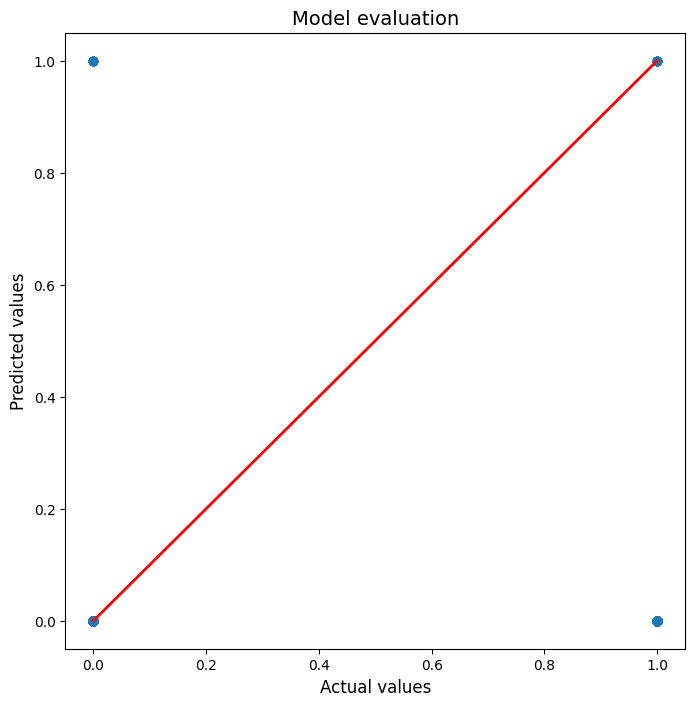

In [7]:
# Model evaluation
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,8))

plt.scatter(y_test, y_pred)
plt.plot([0, 1], [0, 1], color='r', linestyle='-', linewidth=2)

plt.xlabel('Actual values', size=12)
plt.ylabel('Predicted values', size=12)
plt.title('Model evaluation', size=14)
plt.savefig('outputs/03_01_ice_pdp/model_evaluation.png')
plt.show()

In [8]:
pdp_lines = partial_dependence(
    rf,
    X_train,
    features=["Age"],
    percentiles=(0, 1),
    grid_resolution=100,
    kind='individual'
)
len(pdp_lines['individual'][0])

14645

In [9]:
print(np.shape(pdp_lines['grid_values']))
print(np.shape(pdp_lines['individual']))

(1, 6)
(1, 14645, 6)


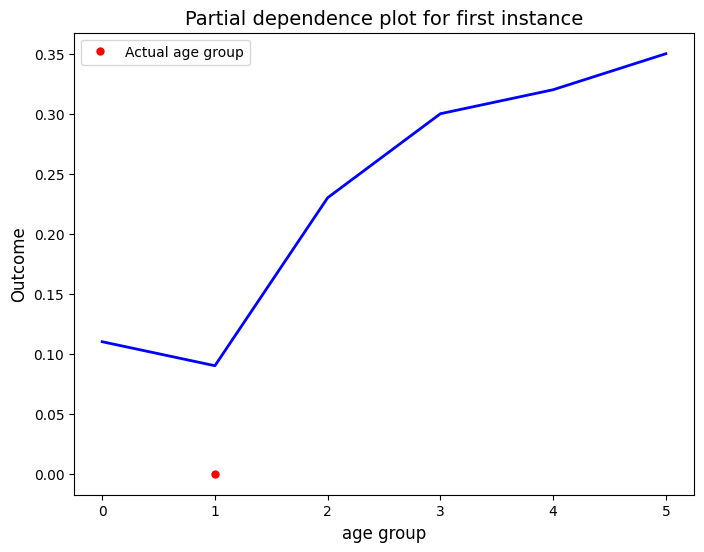

In [10]:
plt.figure(figsize=(8, 6))
plt.plot(pdp_lines['grid_values'][0], pdp_lines['individual'][0][0], color='b', linewidth=2)

per_0 = data.iloc[0]
plt.plot(per_0['Age'], y_pred[0], 'ro', markersize=5, label='Actual age group')

plt.xlabel('age group', size=12)
plt.ylabel('Outcome', size=12)
plt.legend()
plt.title('Partial dependence plot for first instance', size=14)
plt.savefig('outputs/03_01_ice_pdp/pdp.png')
plt.show()

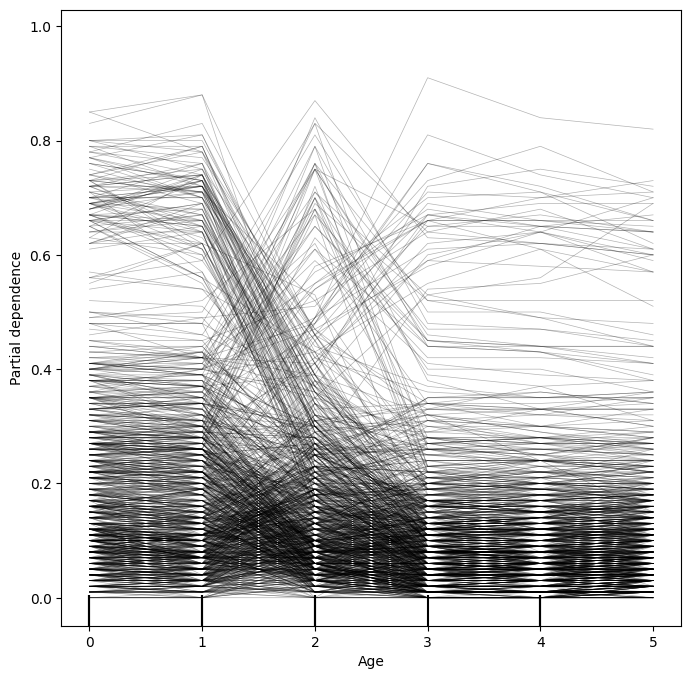

In [11]:
# ICE plot

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,8))
PartialDependenceDisplay.from_estimator(rf, X_train, features=['Age'], 
                                        kind='individual',
                                        ice_lines_kw={"color":"black"},
                                        ax=ax)
plt.savefig('outputs/03_01_ice_pdp/ice_plot.png')
plt.show()

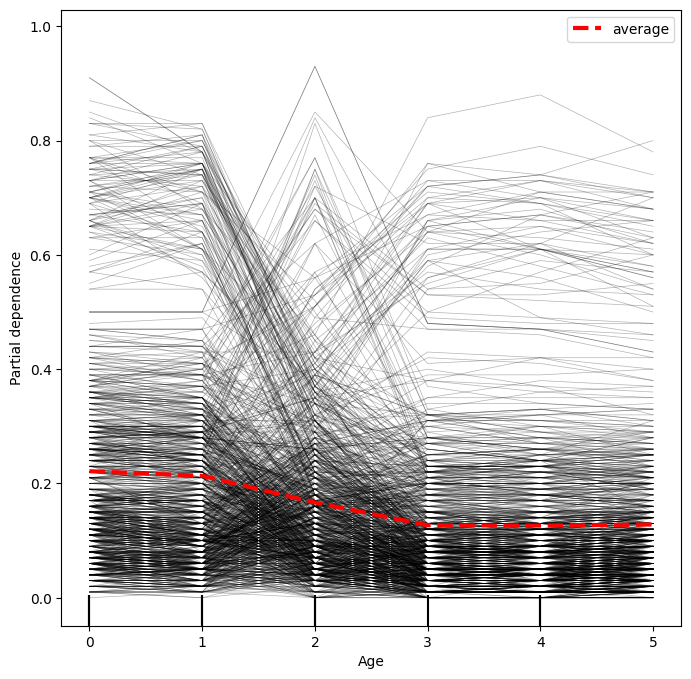

In [12]:
# ICE plot and PDP plot

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,8))
PartialDependenceDisplay.from_estimator(rf, X_train, features=['Age'], 
                                        kind='both',
                                        ice_lines_kw={"color":"black"},
                                        pd_line_kw={"color":"red","lw":3, "linestyle":"--"},
                                        ax=ax)
plt.savefig('outputs/03_01_ice_pdp/ice_pdp_plot.png')
plt.show()

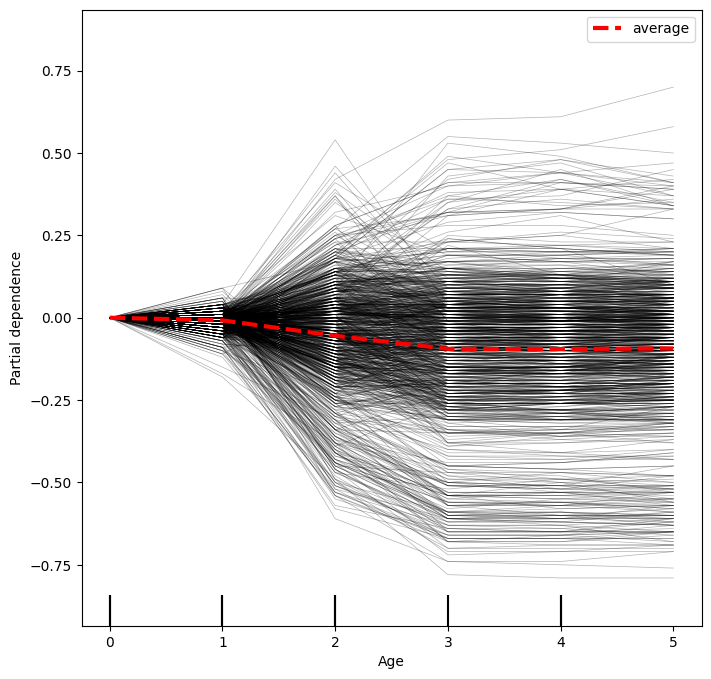

In [13]:
# ICE and PDP plot centered

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,8))
PartialDependenceDisplay.from_estimator(rf, X_train, features=['Age'], 
                                        kind='both',
                                        centered=True,
                                        ice_lines_kw={"color":"black"},
                                        pd_line_kw={"color":"red","lw":3, "linestyle":"--"},
                                        ax=ax)
plt.savefig('outputs/03_01_ice_pdp/ice_pdp_plot_centered.png')
plt.show()

In [14]:
# manual center the lines

for i in range(len(pdp_lines['individual'][0])):
    pdp_start = pdp_lines['individual'][0][i][0]
    for j in range(len(pdp_lines['individual'][0][i])):
        pdp_lines['individual'][0][i][j] = pdp_lines['individual'][0][i][j] - pdp_start

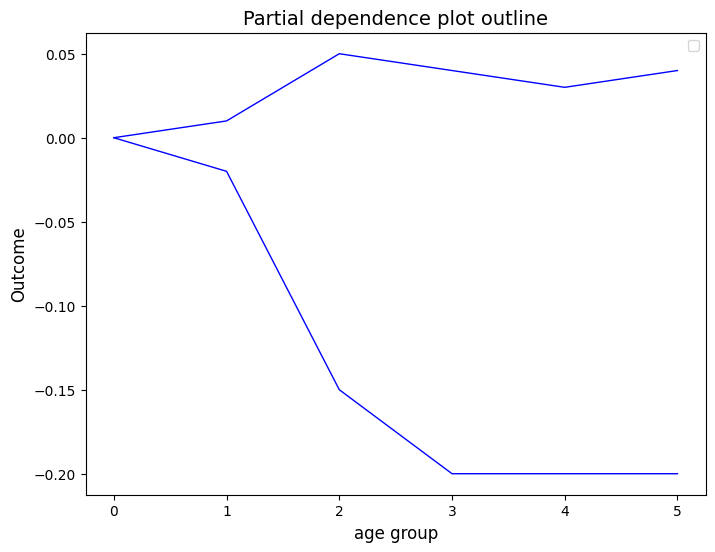

In [15]:
# get all the values that are positive and negative in each category of the feature and calculate the mean of the positive and negative values for each category of the feature and plot them

pdp_values = pdp_lines['individual'][0]
pdp_values = np.array(pdp_values)

q1 = []
q3 = []

for i in range(0,6):

    all_val = []

    for j in range(len(pdp_values)):
        all_val.append(pdp_values[j][i])
    
    iqr = stats.iqr(all_val)
    q1x = np.percentile(all_val, 25)
    q3x = np.percentile(all_val, 75)

    q1.append(q1x)
    q3.append(q3x)



plt.figure(figsize=(8, 6))
plt.plot(pdp_lines['grid_values'][0], q1, color='b', linewidth=1)
plt.plot(pdp_lines['grid_values'][0], q3, color='b', linewidth=1)

plt.xlabel('age group', size=12)
plt.ylabel('Outcome', size=12)
plt.legend()
plt.title('Partial dependence plot outline', size=14)
plt.savefig('outputs/03_01_ice_pdp/pdp_outline.png')
plt.show()

Gender
['A man', 'A woman']
Categories (2, object): ['A man', 'A woman']


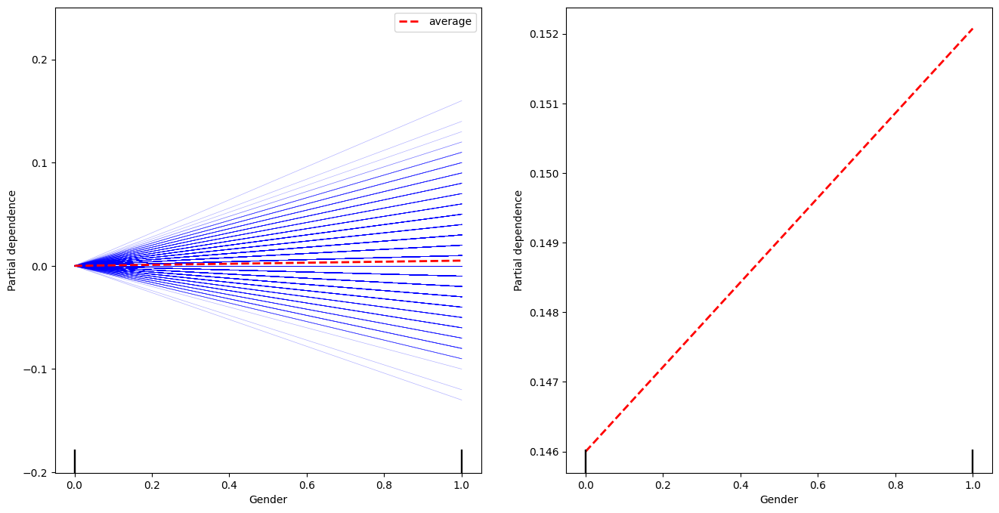

Age
['18 - 30', '30 - 39', '40 - 44', '45 - 49', '50 - 55', '56 - 70']
Categories (6, object): ['18 - 30' < '30 - 39' < '40 - 44' < '45 - 49' < '50 - 55' < '56 - 70']


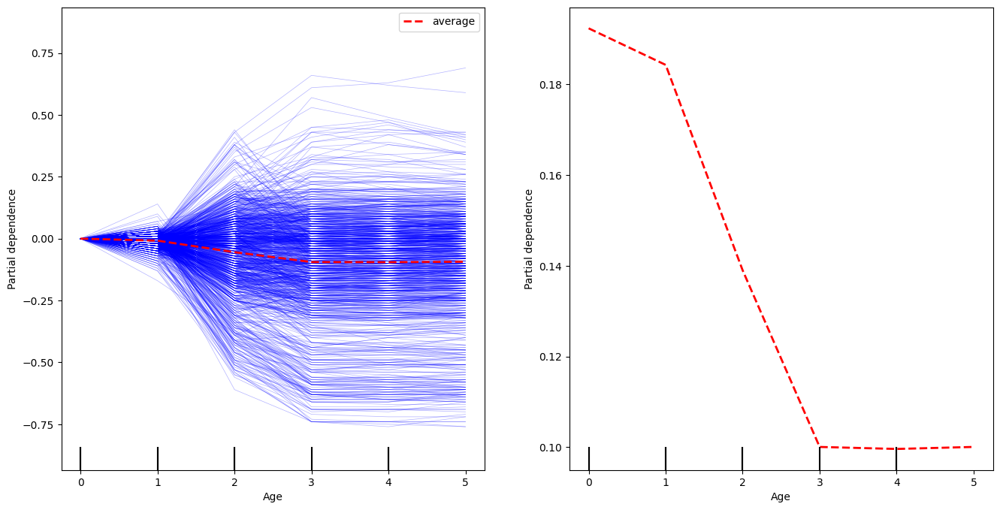

Work type
['Frames', 'AM Technicians', 'Employees', 'Workers']
Categories (4, object): ['Frames', 'AM Technicians', 'Employees', 'Workers']


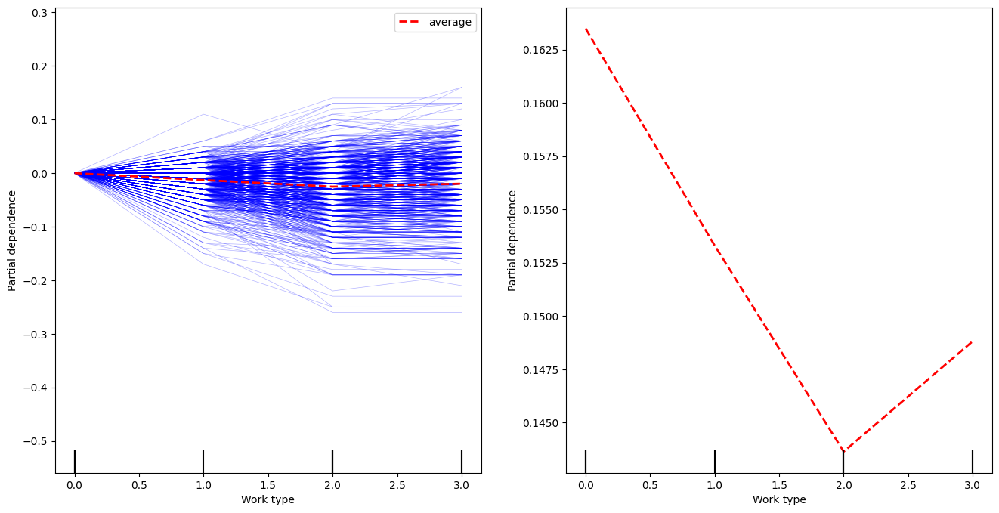

sector
['Industry', 'Construction', 'Wholesale trade (all businesses in 206)', 'Retail business', 'Other businesses', 'Design office and engineering', 'Human health and social action', 'Services', 'Transport, energy, telecommunications']
Categories (9, object): ['Industry', 'Construction', 'Wholesale trade (all businesses in 206)', 'Retail business', ..., 'Design office and engineering', 'Human health and social action', 'Services', 'Transport, energy, telecommunications']


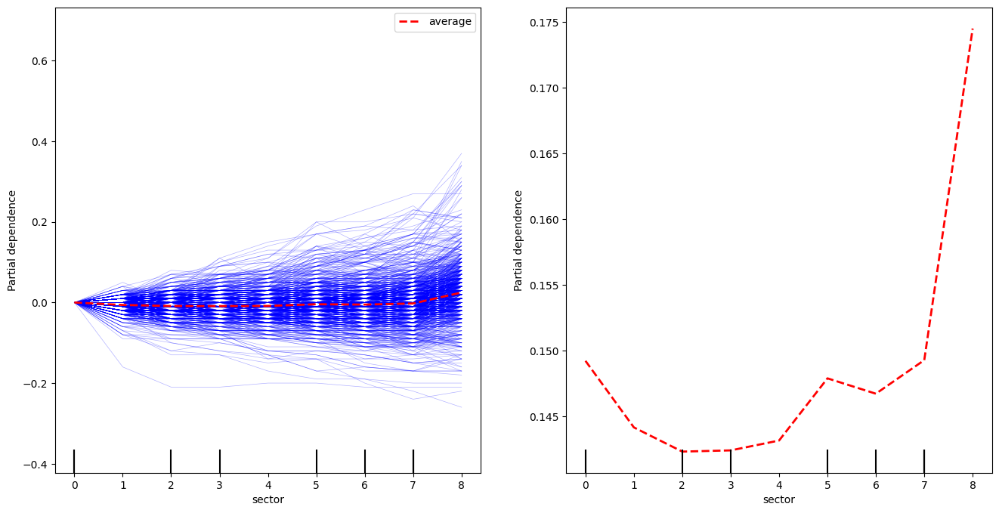

size of business
['0 - 9', '10 - 49', '50 - 249', '250 - 999']
Categories (4, object): ['0 - 9' < '10 - 49' < '50 - 249' < '250 - 999']


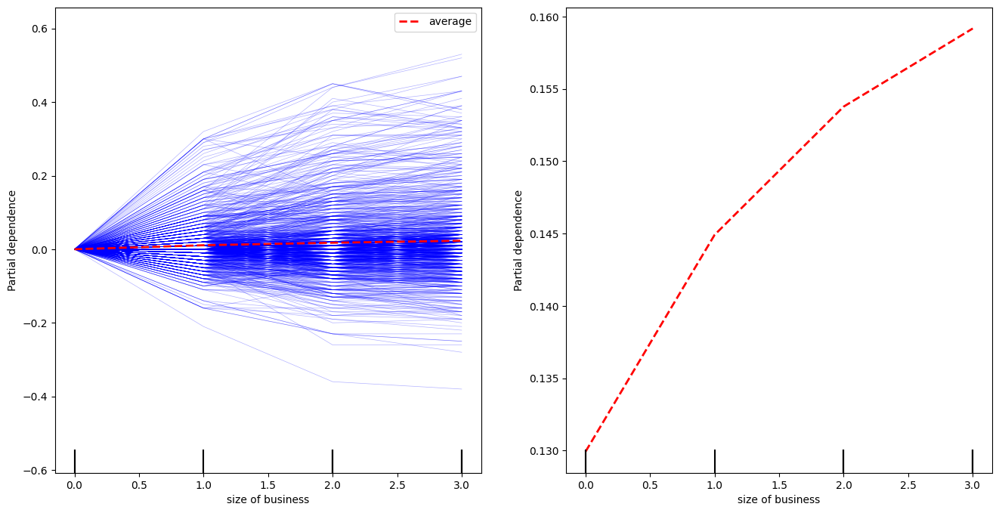

No of 3 to 6 years old children


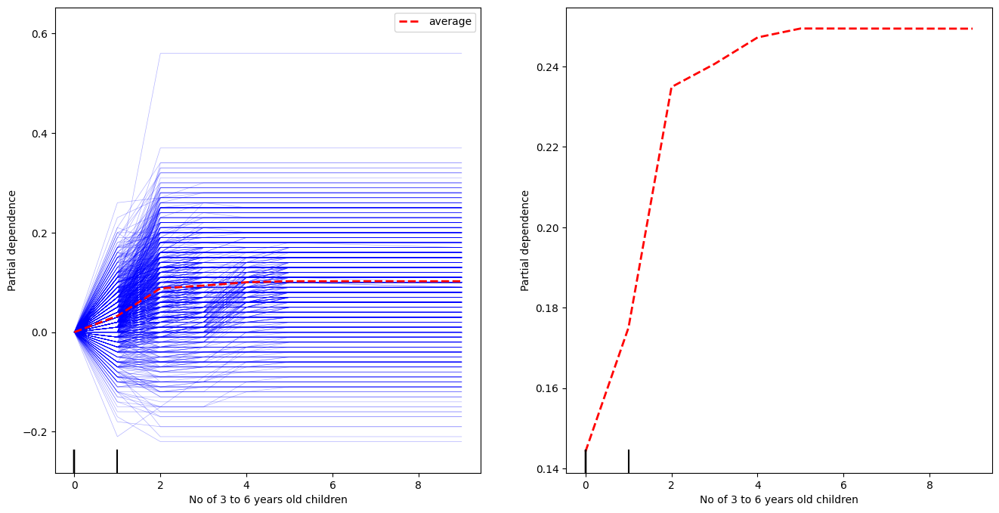

No of 7 to 12 years old children


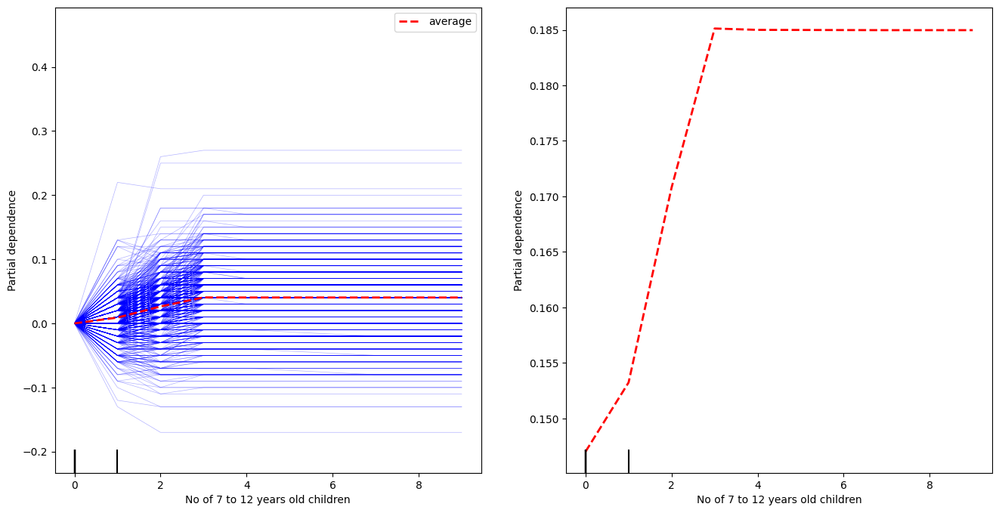

No of 13 to 17 years old children


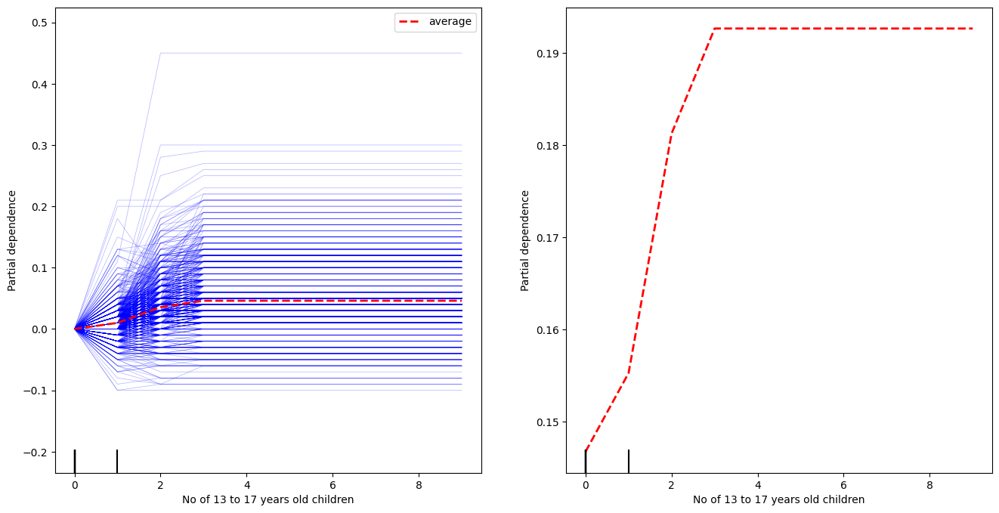

No of 18 years and over children


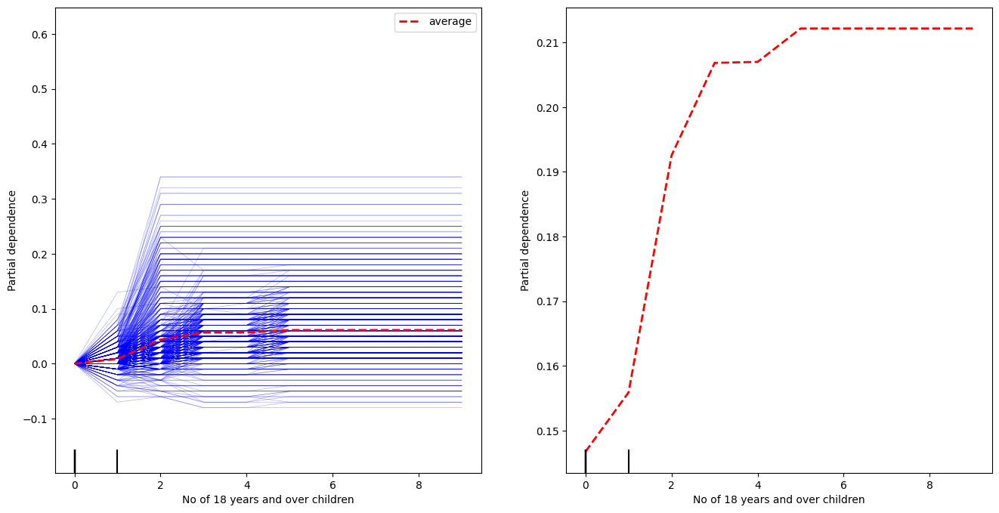

dependents
['Yes, who lives with me', 'Yes, who lives elsewhere', 'No']
Categories (3, object): ['Yes, who lives with me', 'Yes, who lives elsewhere', 'No']


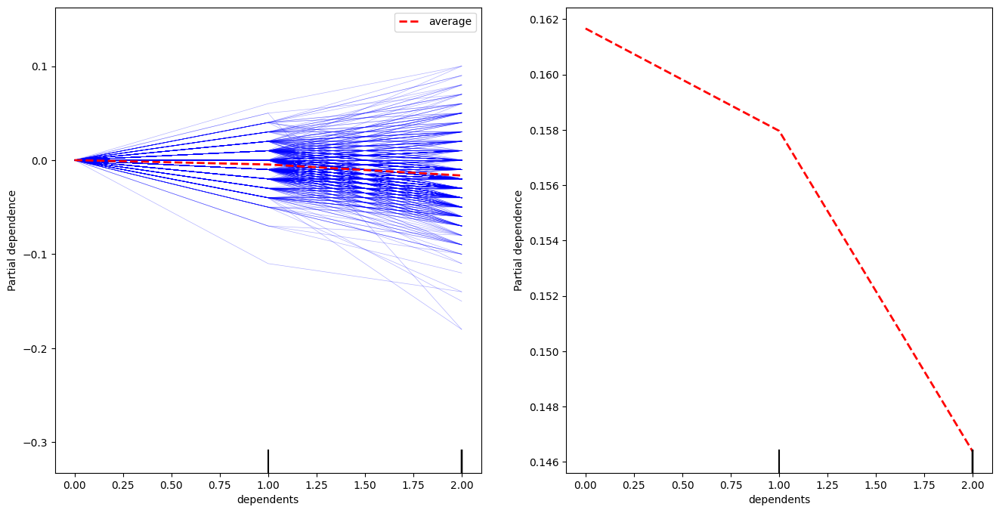

Full Time/Part Time
['Full time', 'Part time']
Categories (2, object): ['Full time', 'Part time']


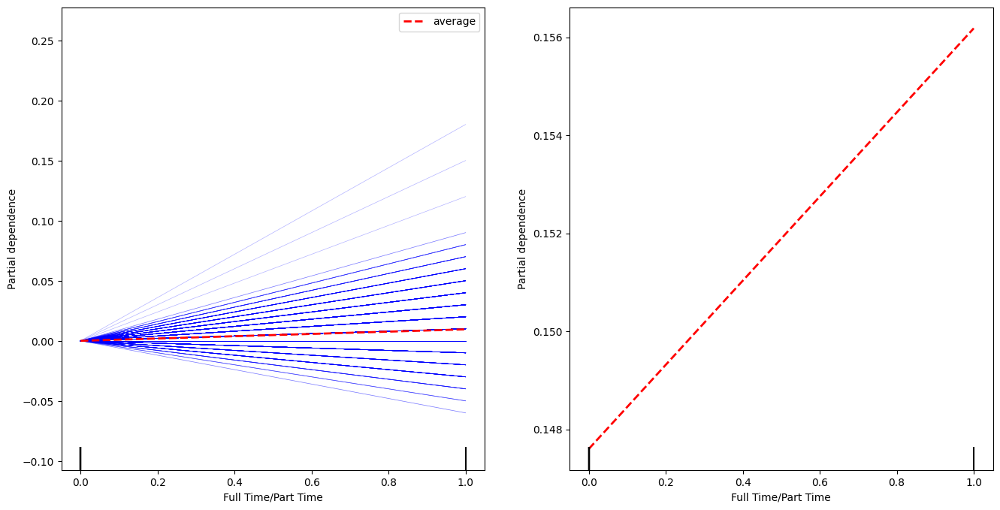

shift work with alternating hours
['Yes', 'No']
Categories (2, object): ['Yes', 'No']


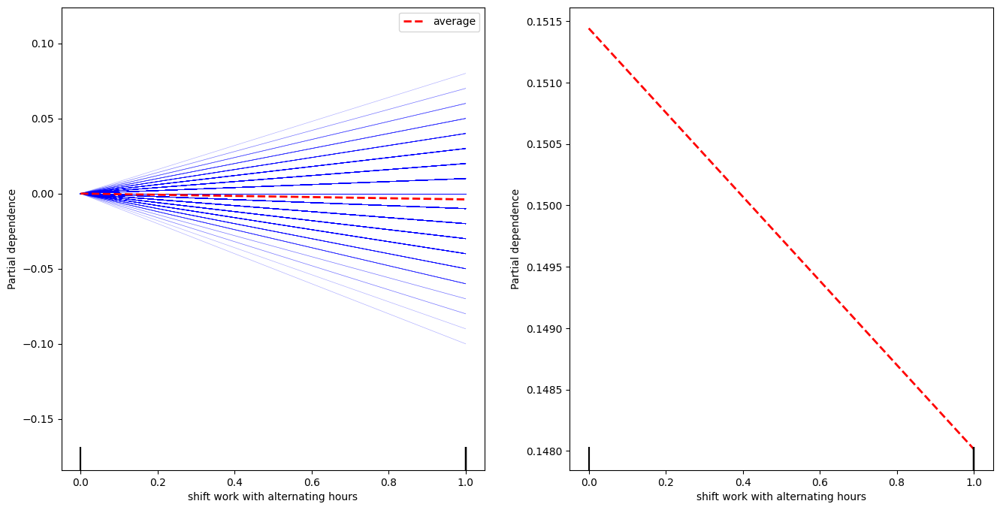

Place of work
['In an office alone or in pairs', 'In a shared office (3 to 5 people)', 'In an open space, a tray', 'In a workshop, a technical room', 'In a commercial premises or agency', 'In a vehicle', 'Outside-outside', 'At home teleworking', 'At customers', 'In a shared work space - co-working']
Categories (10, object): ['In an office alone or in pairs', 'In a shared office (3 to 5 people)', 'In an open space, a tray', 'In a workshop, a technical room', ..., 'Outside-outside', 'At home teleworking', 'At customers', 'In a shared work space - co-working']


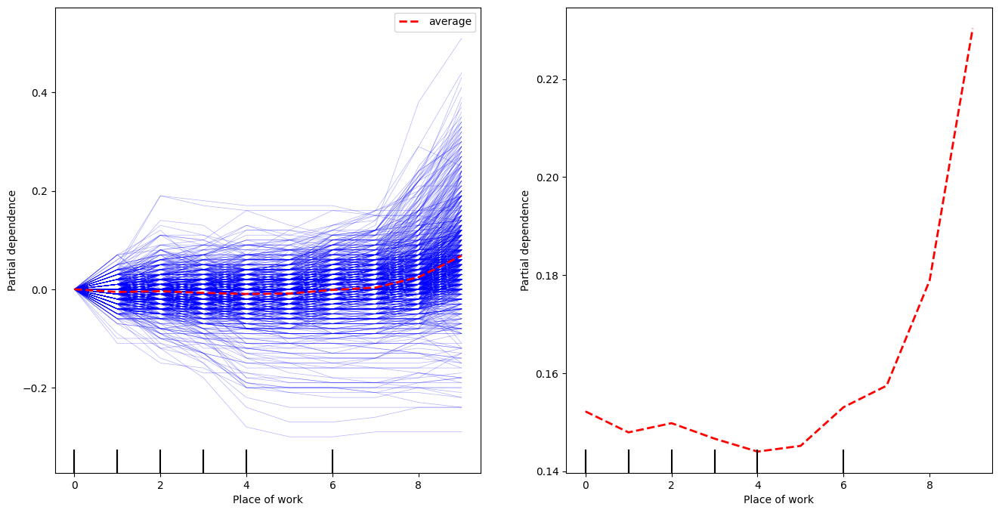

standing or in an awkward posture
['Most of the time', 'Occasionally', 'Rarely', 'Never']
Categories (4, object): ['Most of the time' < 'Occasionally' < 'Rarely' < 'Never']


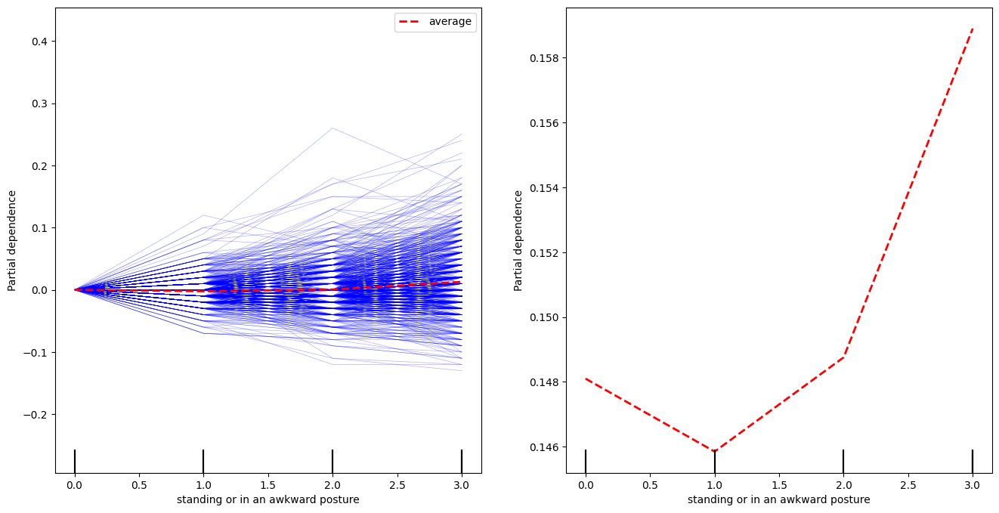

carry or move heavy loads
['Most of the time', 'Occasionally', 'Rarely', 'Never']
Categories (4, object): ['Most of the time' < 'Occasionally' < 'Rarely' < 'Never']


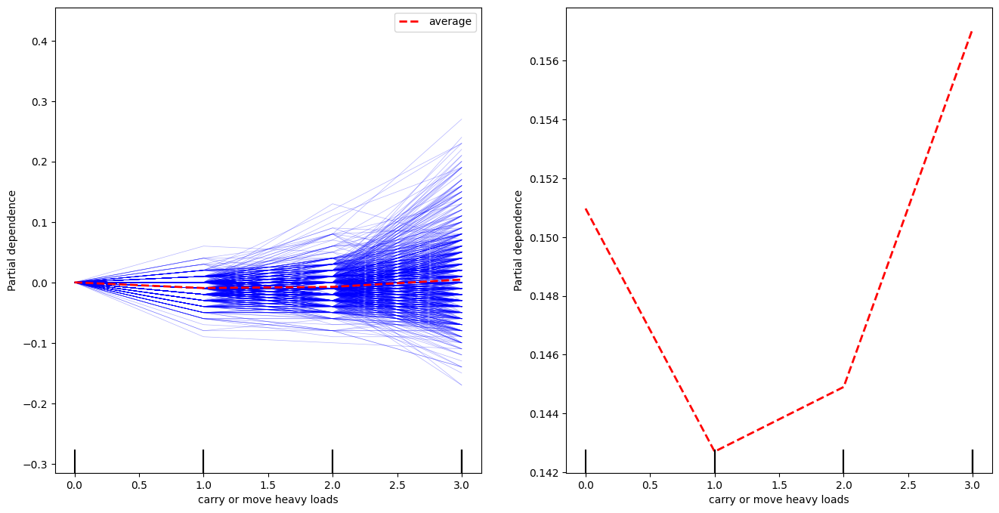

perform repetitive gestures
['Most of the time', 'Occasionally', 'Rarely', 'Never']
Categories (4, object): ['Most of the time' < 'Occasionally' < 'Rarely' < 'Never']


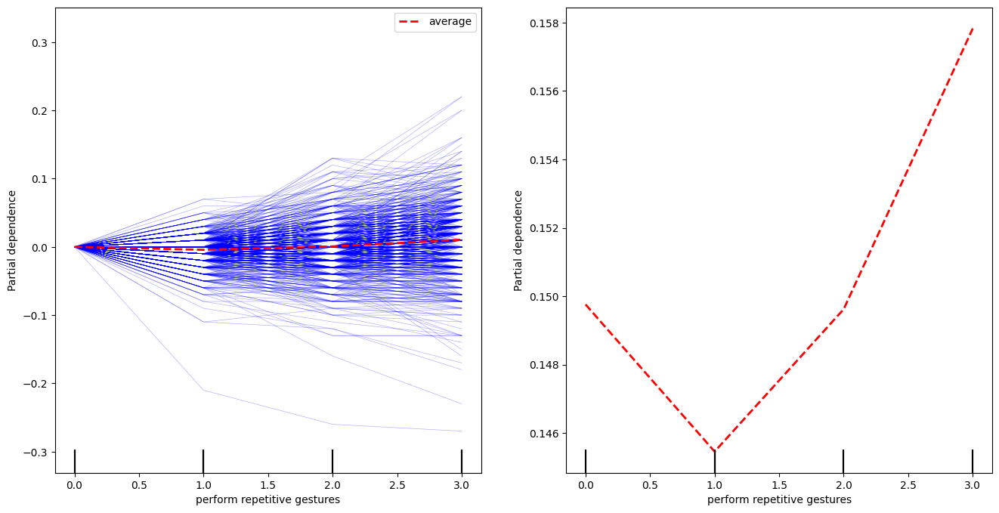

work on screen
['Most of the time', 'Occasionally', 'Rarely', 'Never']
Categories (4, object): ['Most of the time' < 'Occasionally' < 'Rarely' < 'Never']


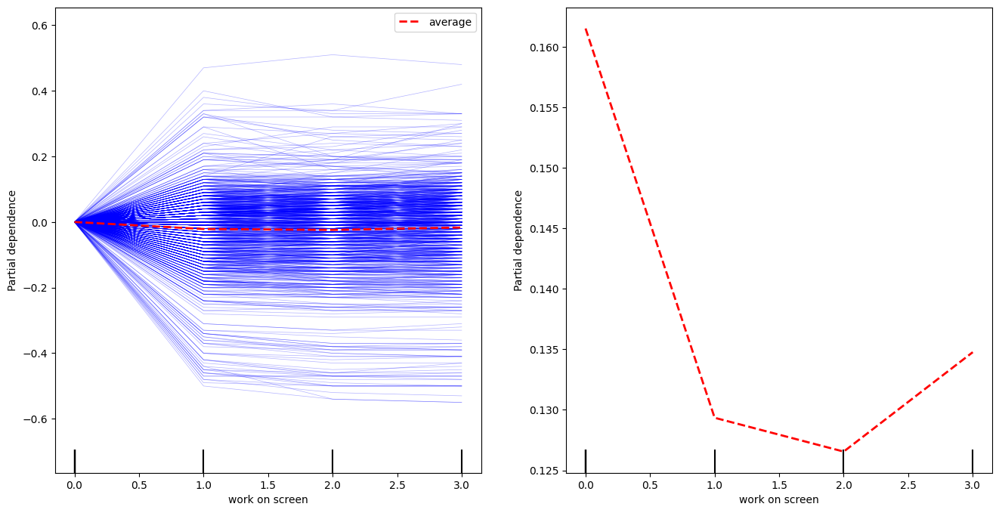

cold/ hot env
['Most of the time', 'Occasionally', 'Rarely', 'Never']
Categories (4, object): ['Most of the time' < 'Occasionally' < 'Rarely' < 'Never']


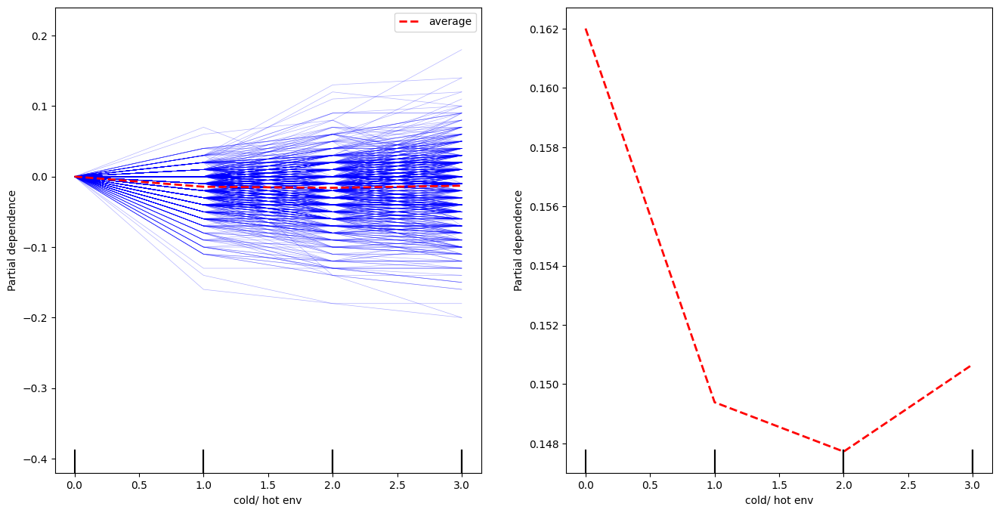

work in noisy env
['Most of the time', 'Occasionally', 'Rarely', 'Never']
Categories (4, object): ['Most of the time' < 'Occasionally' < 'Rarely' < 'Never']


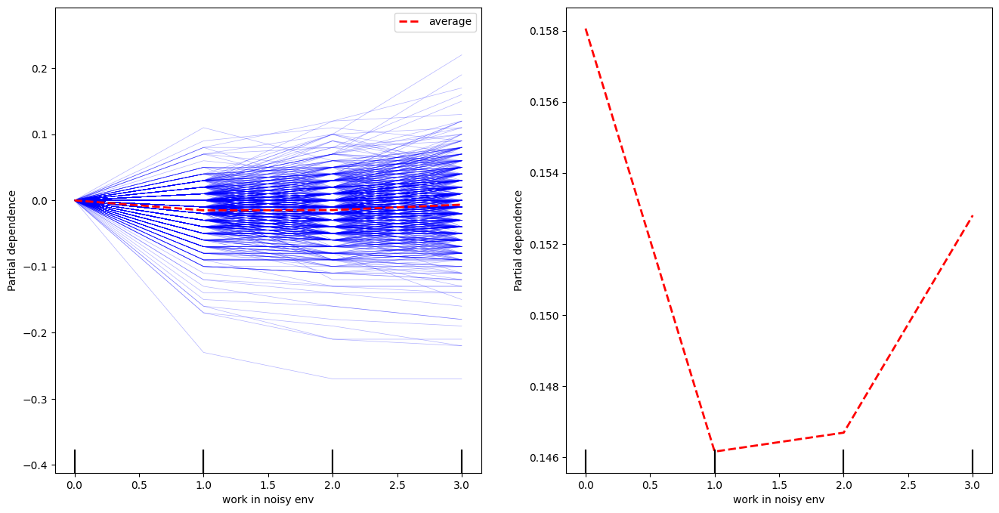

breathe toxic products or dust
['Yes', 'No']
Categories (2, object): ['Yes', 'No']


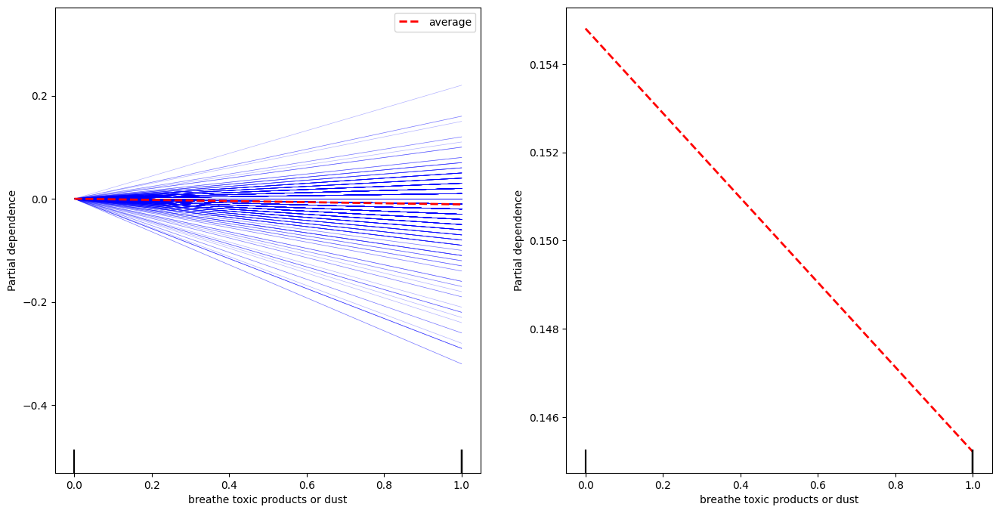

handle toxic or dangerous products
['Yes', 'No']
Categories (2, object): ['Yes', 'No']


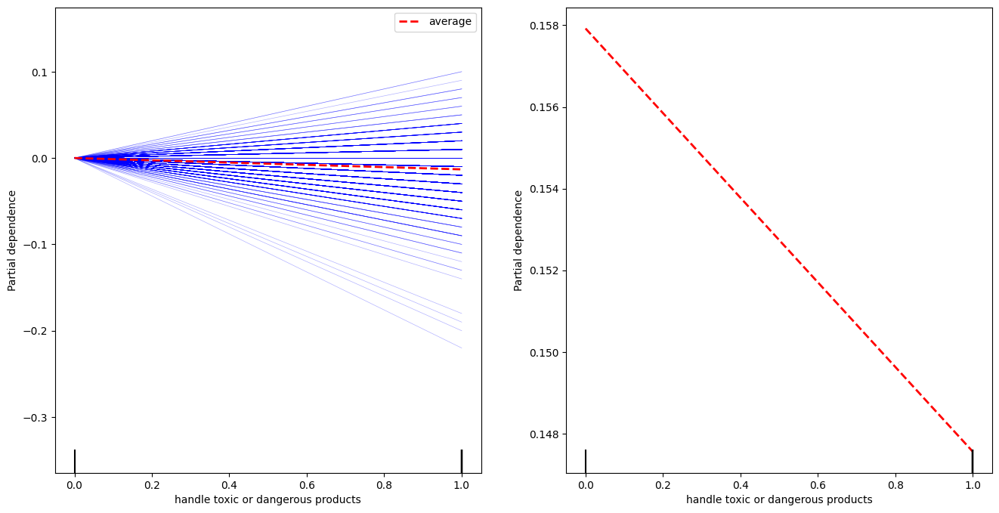

risk of serious fall
['Yes', 'No']
Categories (2, object): ['Yes', 'No']


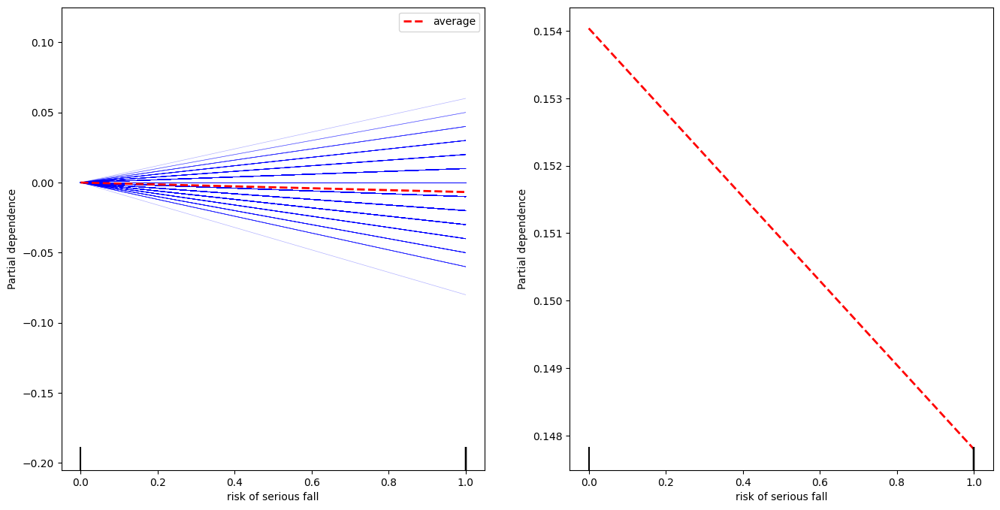

machinery with exposure to injury
['Yes', 'No']
Categories (2, object): ['Yes', 'No']


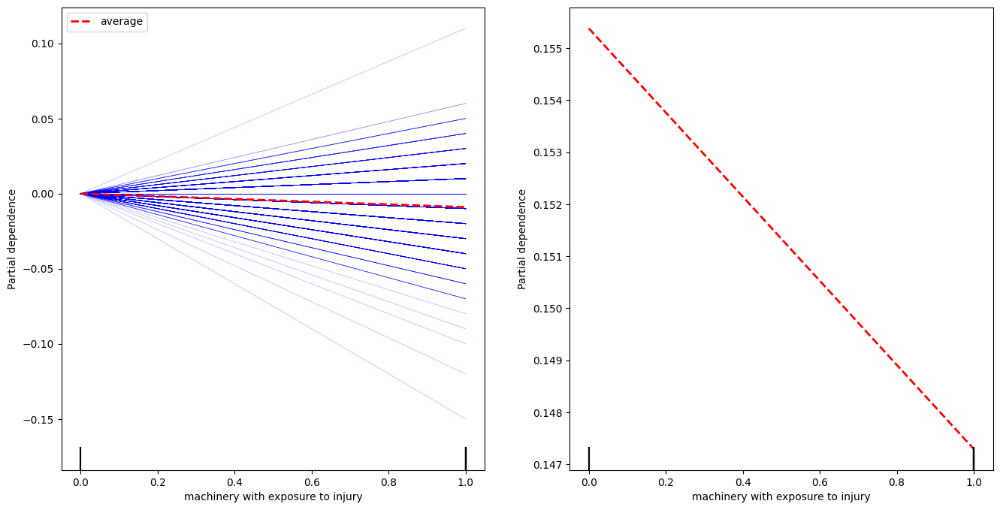

learn new things
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


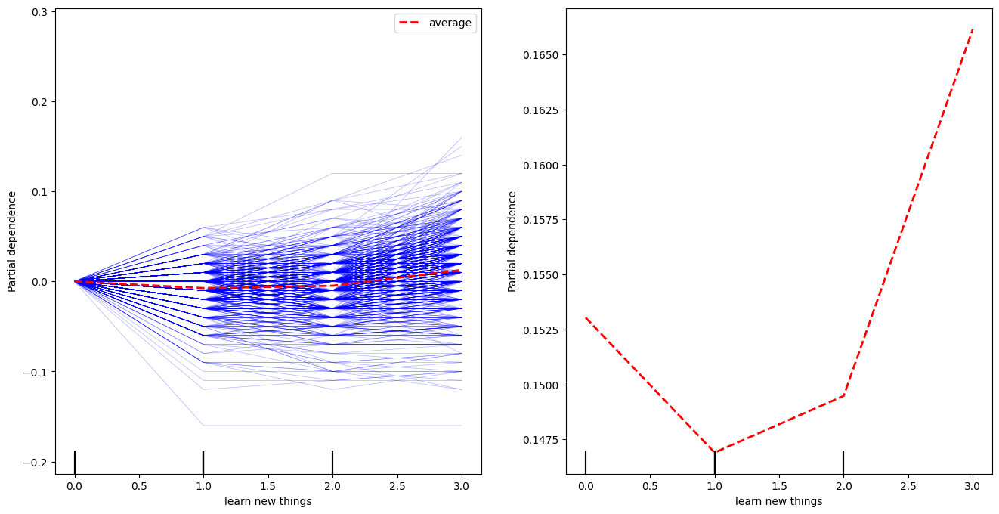

work quickly or very intensely
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


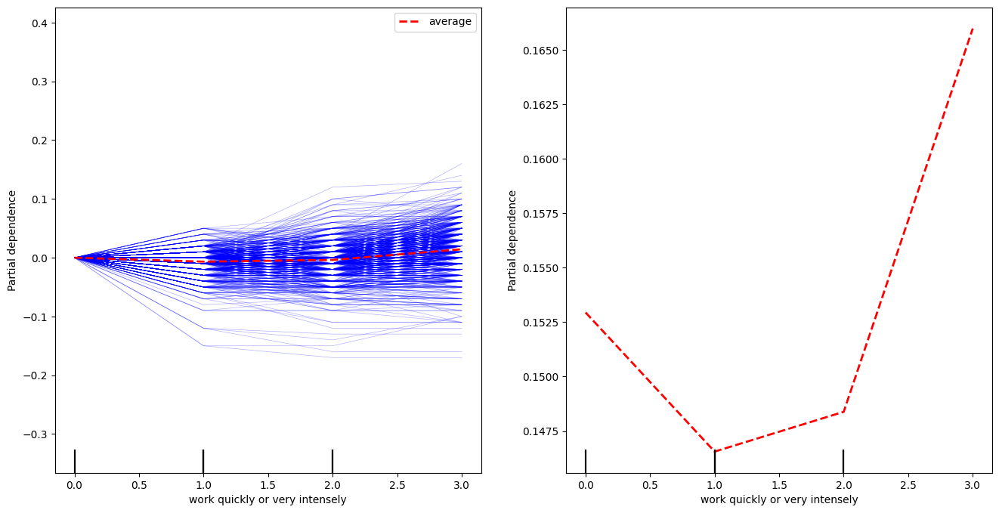

long periods of concentration
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


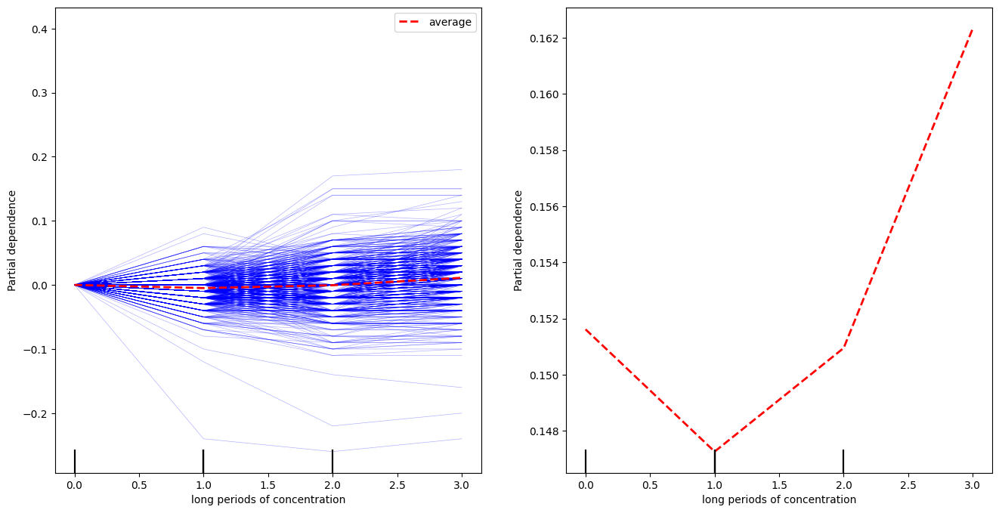

physically tiring
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


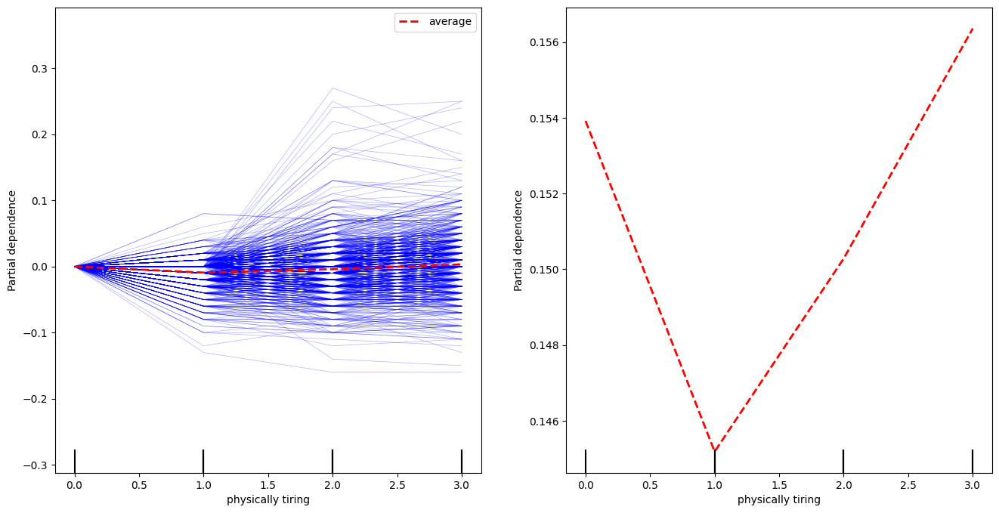

mentally tiring
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


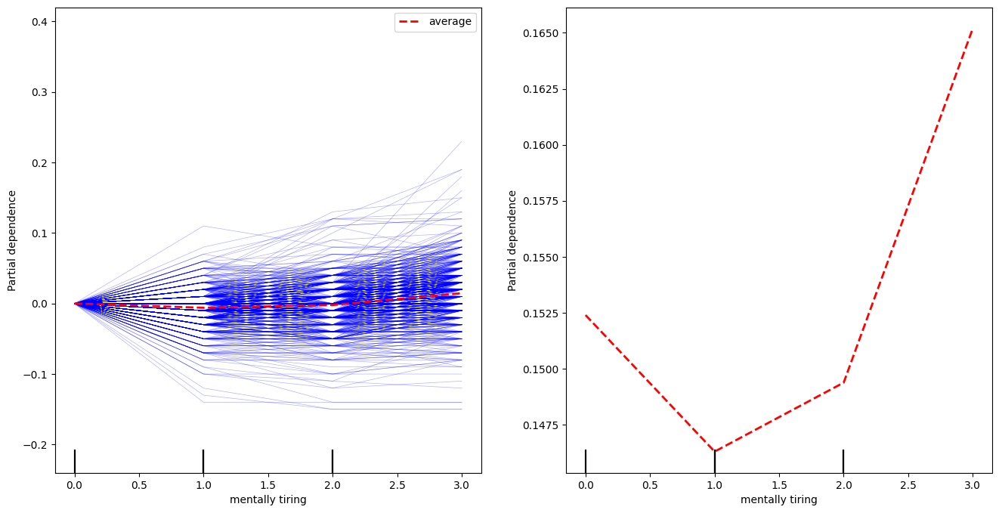

satisfaction with work
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


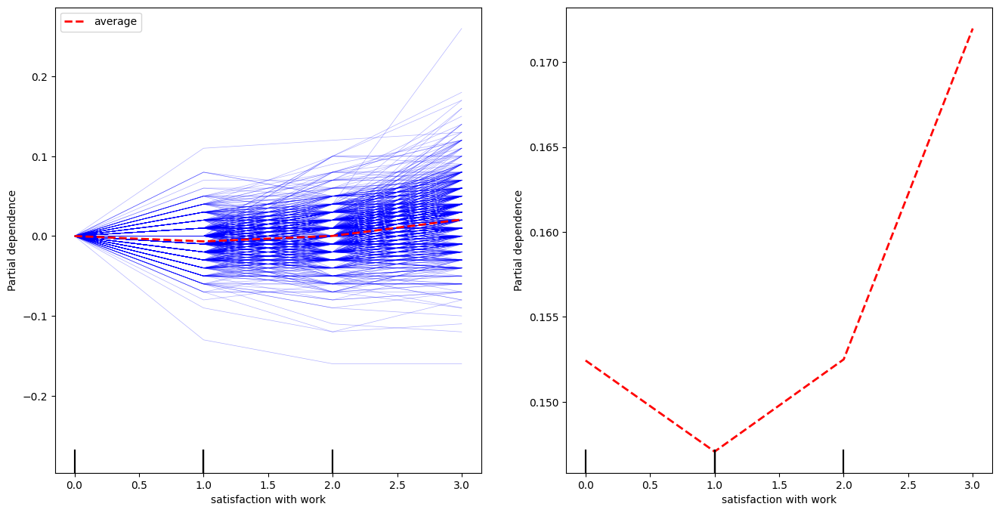

make decisions
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


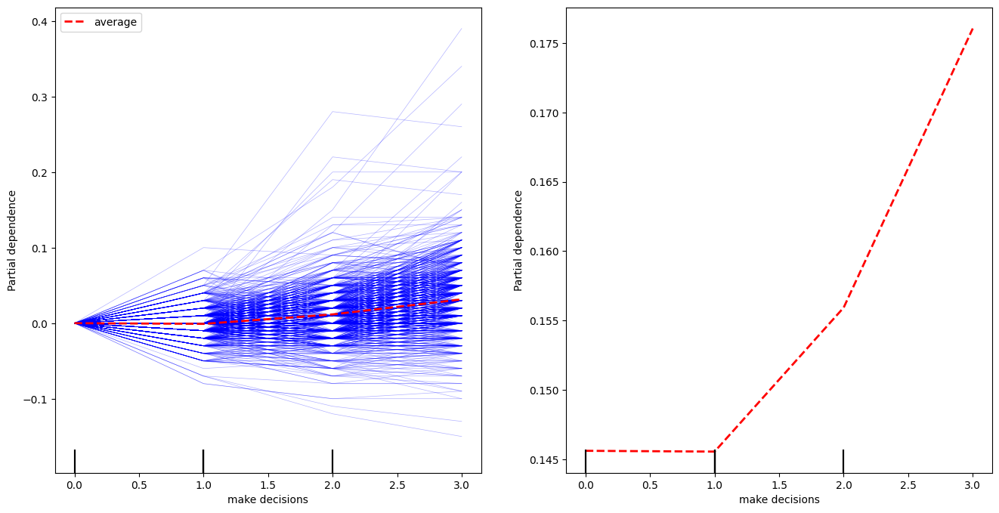

difficulty managing priorities
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


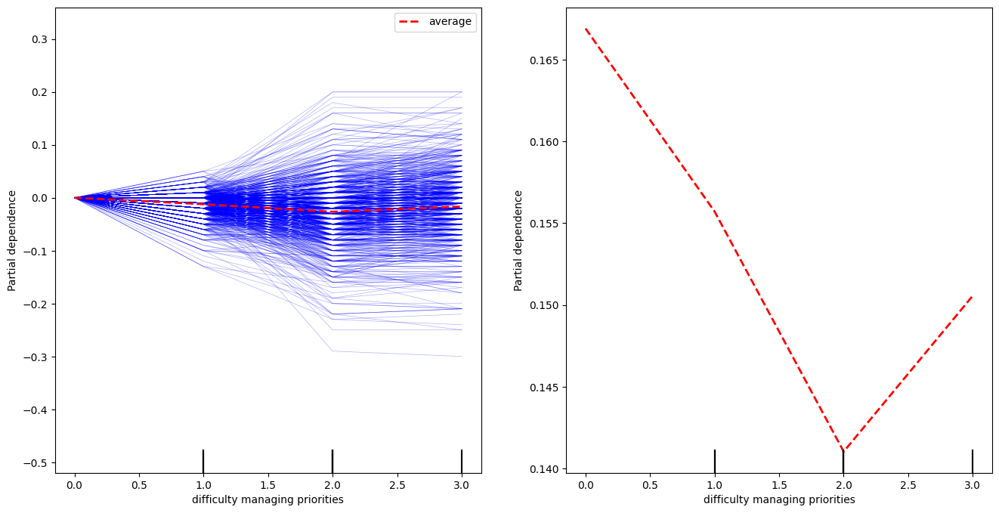

recognized by my hierarchy
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


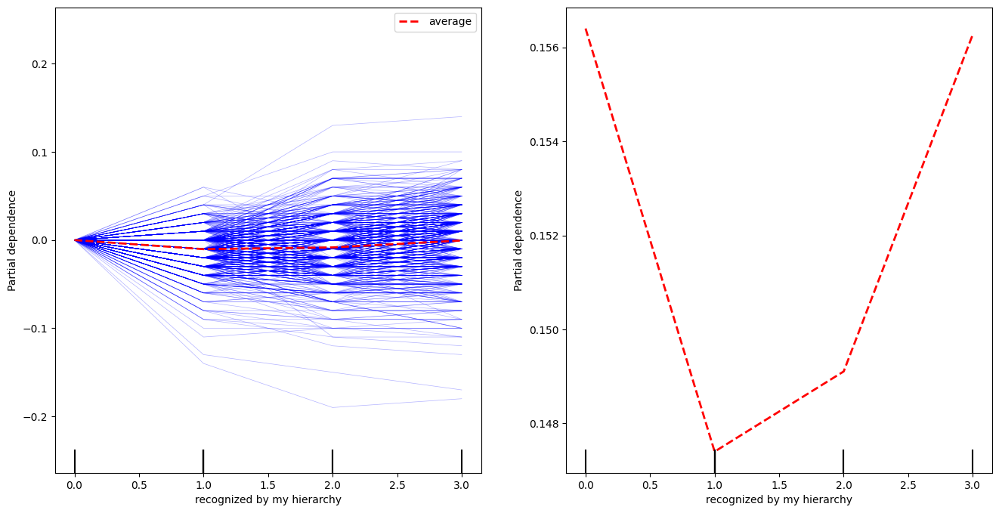

develop professional skills
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


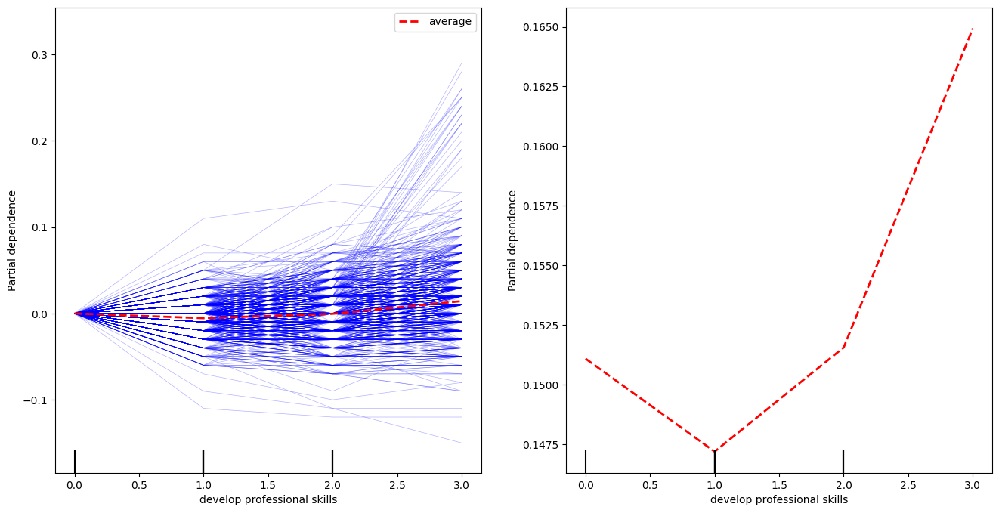

good understanding where I work
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


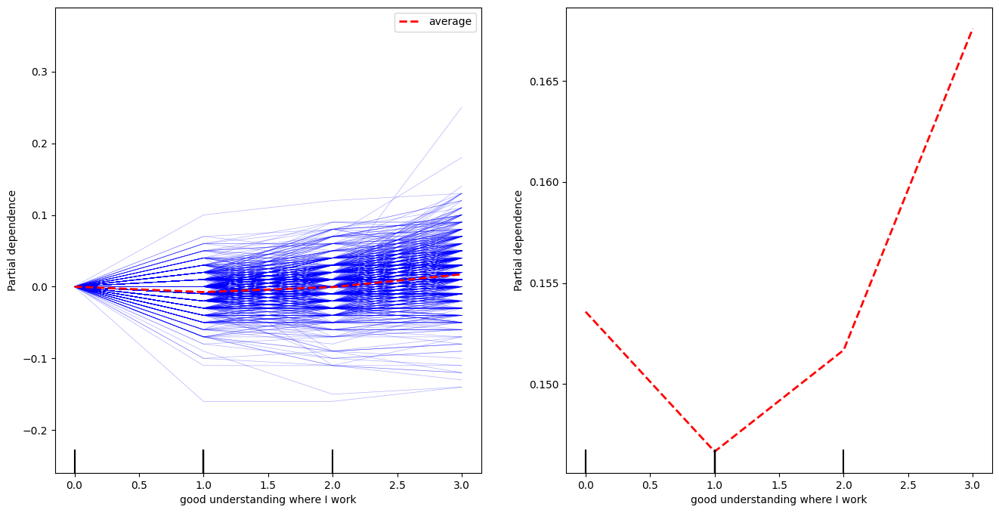

well-suited workstation
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


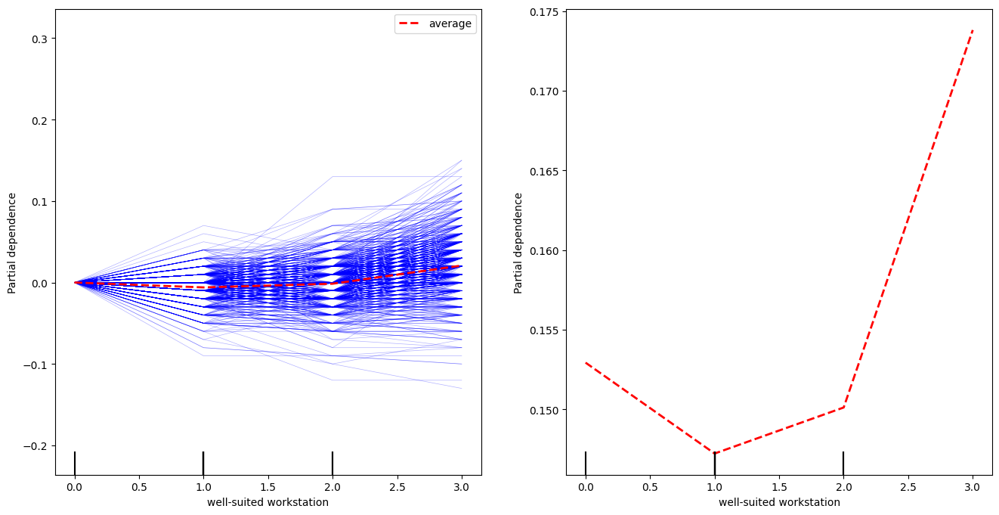

seek to improve the way I work
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


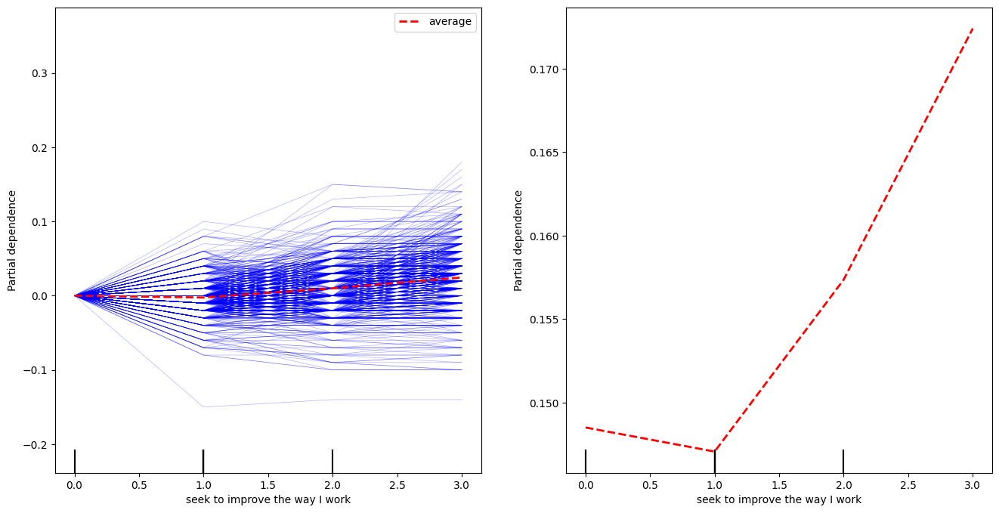

well-being of its employees
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


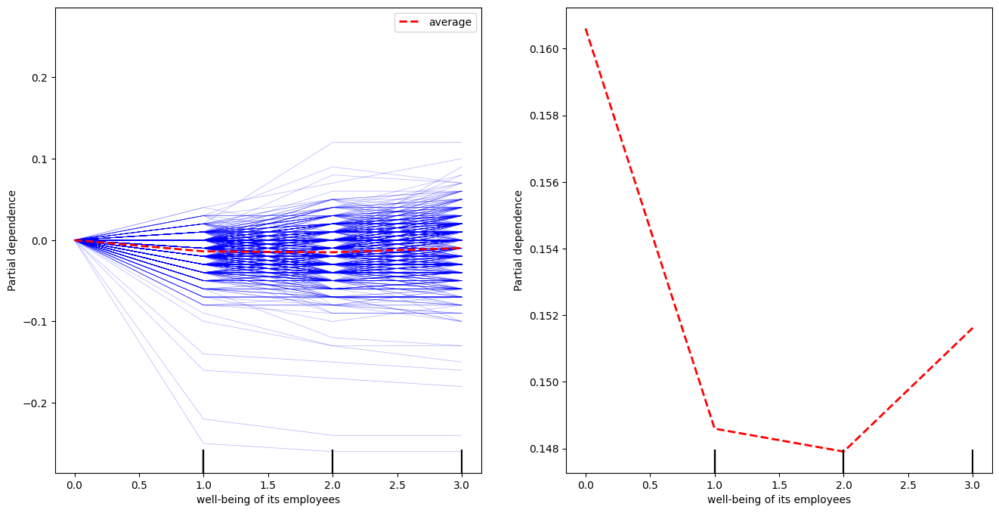

Security is a priority
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


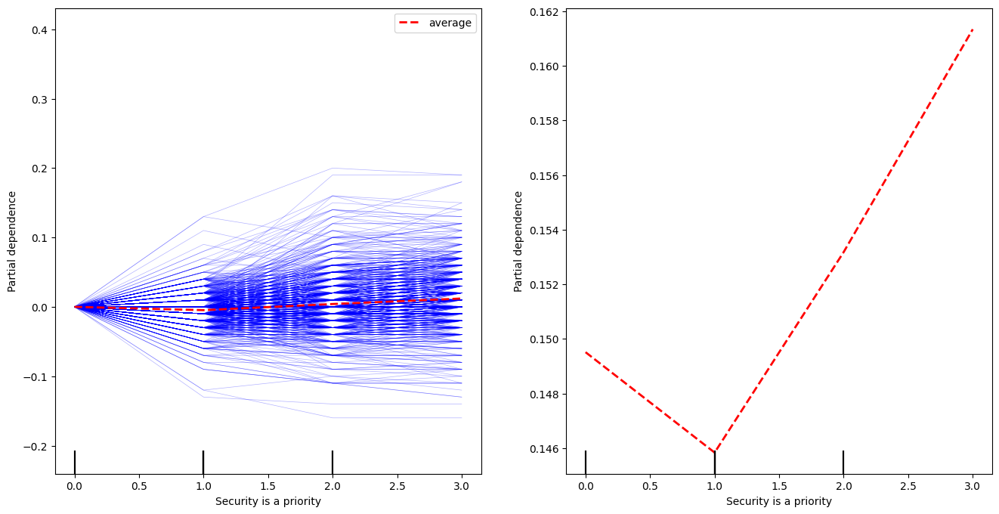

count on supervisor
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


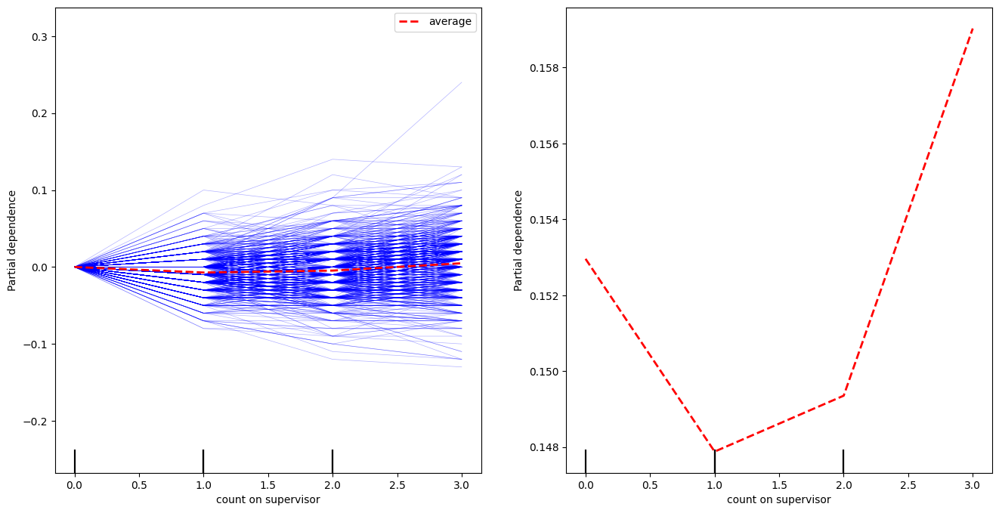

recommend the company
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


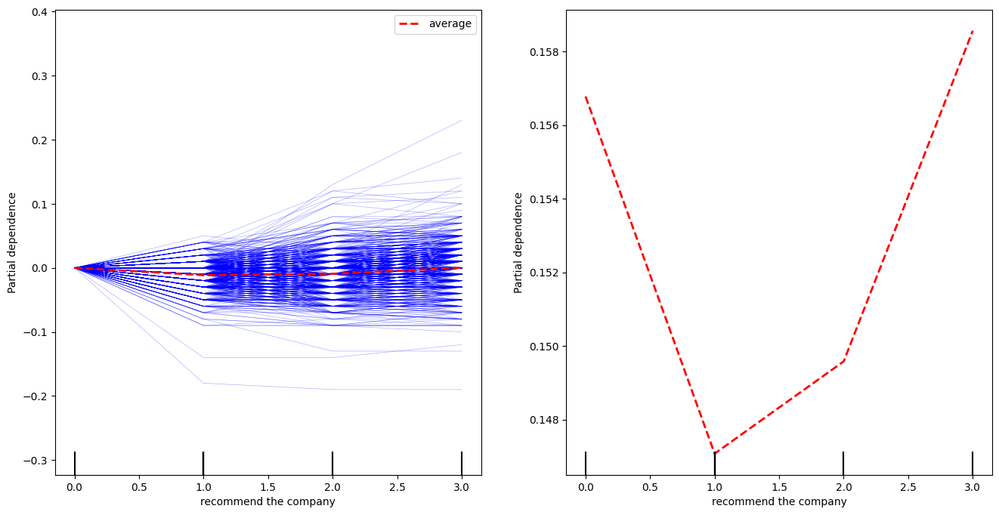

decreased alertness
['Very Often', 'Often', 'Sometimes', 'Never']
Categories (4, object): ['Very Often' < 'Often' < 'Sometimes' < 'Never']


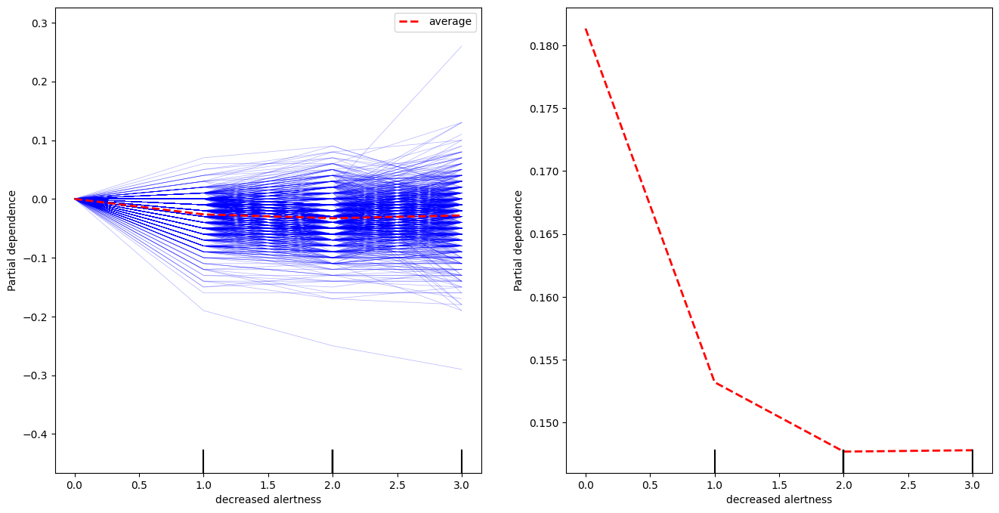

hurtful or aggressive remarks
['Very Often', 'Often', 'Sometimes', 'Never']
Categories (4, object): ['Very Often' < 'Often' < 'Sometimes' < 'Never']


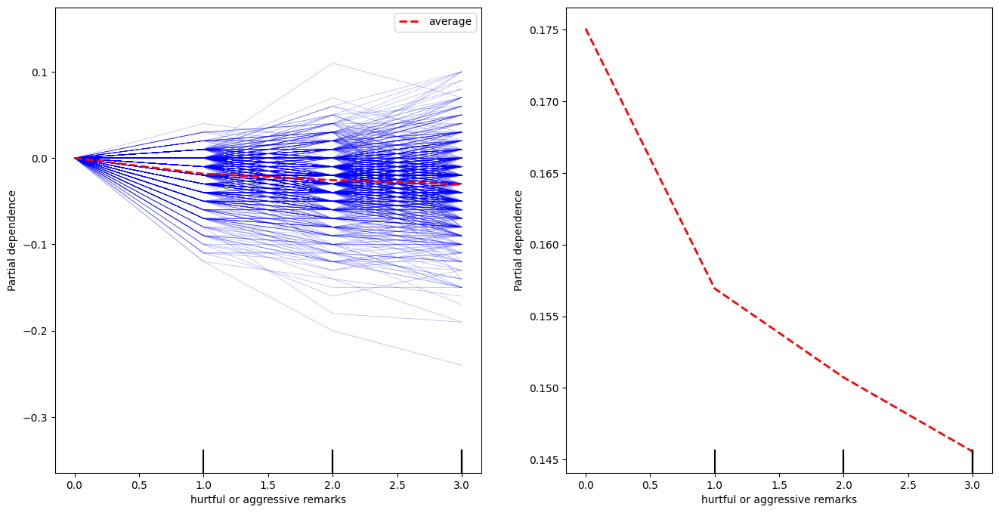

insulted or attacked by the public or customers
['Very Often', 'Often', 'Sometimes', 'Never']
Categories (4, object): ['Very Often' < 'Often' < 'Sometimes' < 'Never']


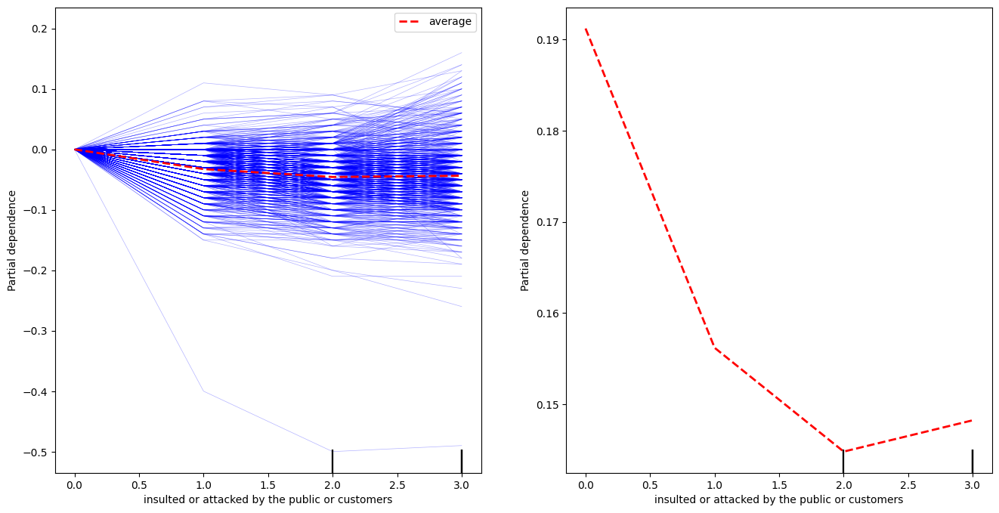

clarity of your role in the company
['Satisfying', 'Unsatisfactory']
Categories (2, object): ['Satisfying', 'Unsatisfactory']


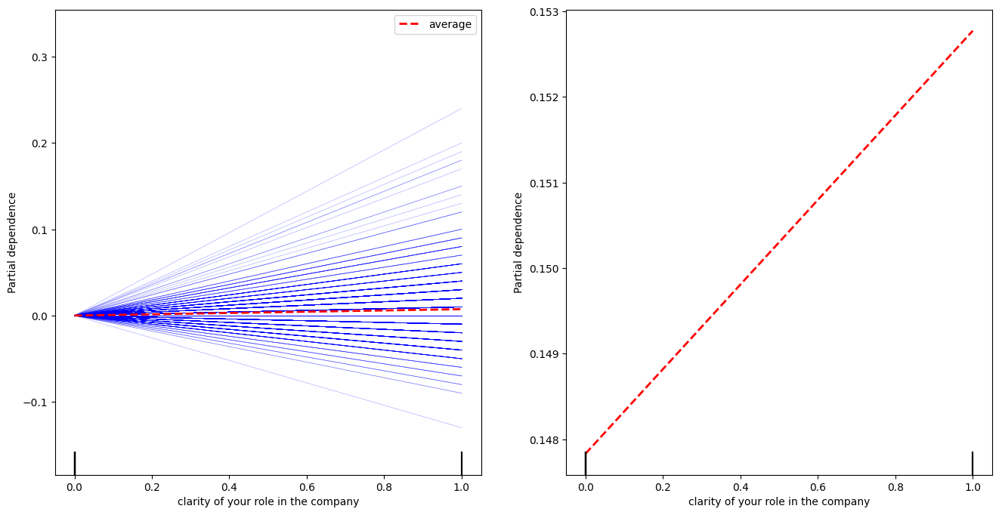

access to professional training
['Satisfying', 'Unsatisfactory']
Categories (2, object): ['Satisfying', 'Unsatisfactory']


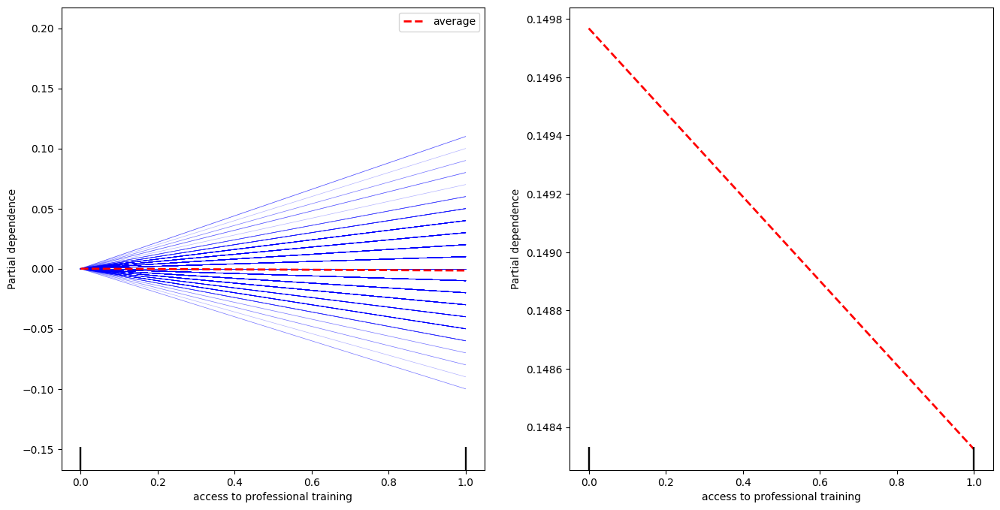

tools or workstation
['Satisfying', 'Unsatisfactory']
Categories (2, object): ['Satisfying', 'Unsatisfactory']


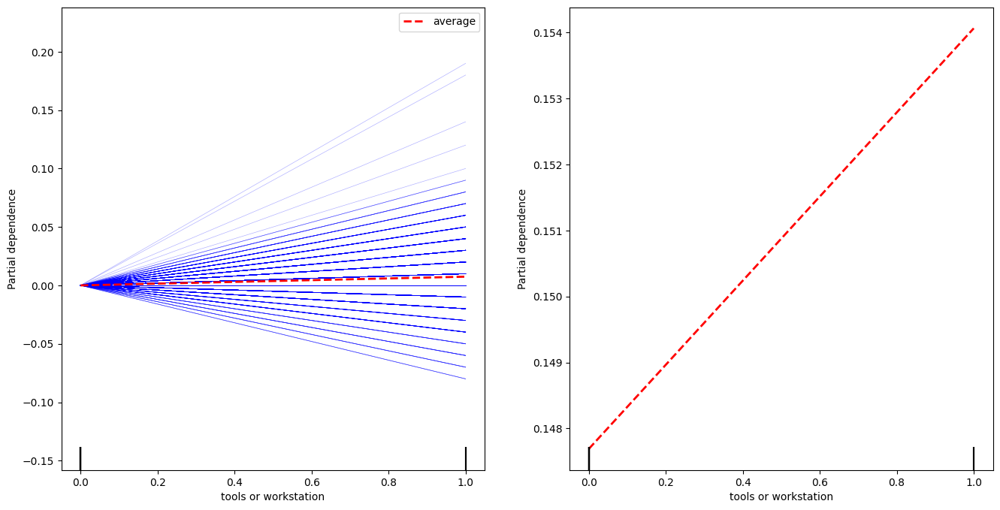

prospects for development
['Satisfying', 'Unsatisfactory']
Categories (2, object): ['Satisfying', 'Unsatisfactory']


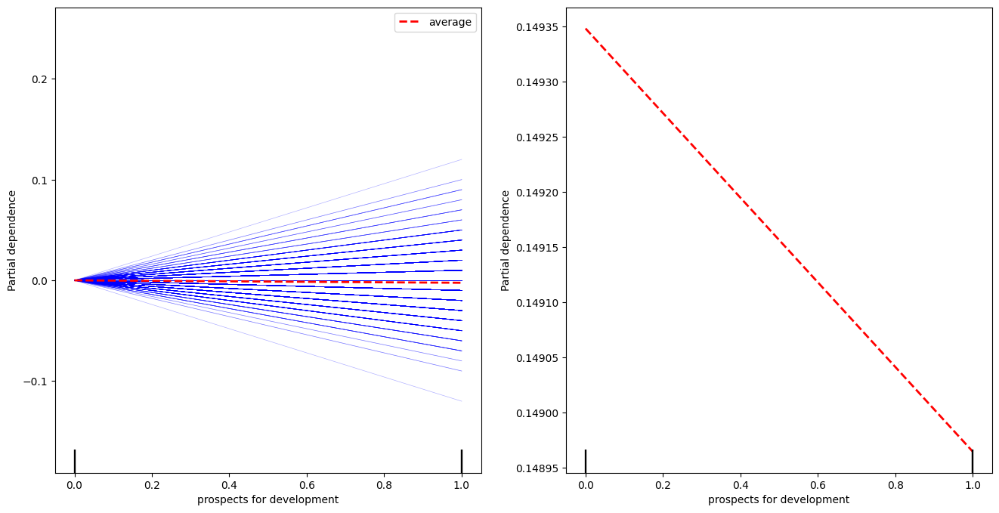

mastery of position
['Satisfying', 'Unsatisfactory']
Categories (2, object): ['Satisfying', 'Unsatisfactory']


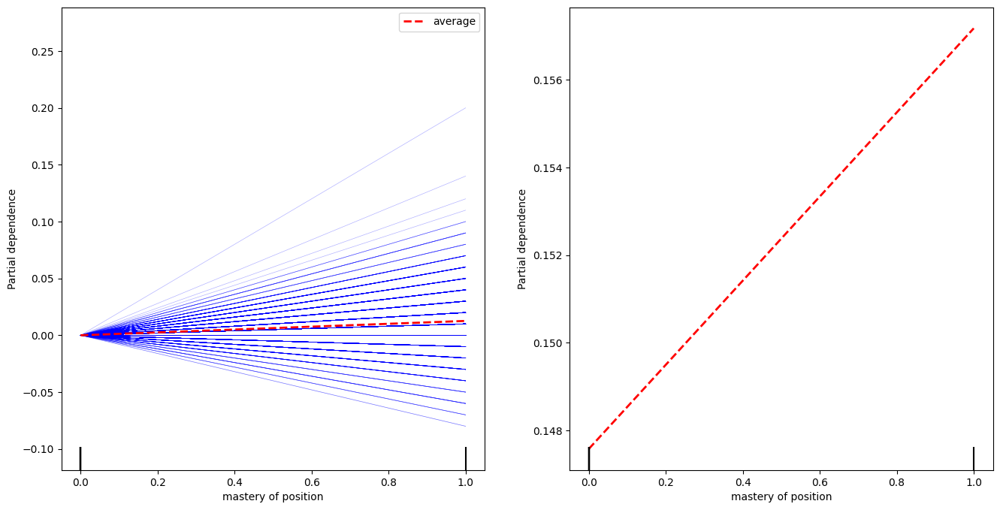

difficulty reconciling your work with your other personal commitments
['Yes quite', 'Yes, rather', 'No, rather not', 'No not at all']
Categories (4, object): ['Yes quite', 'Yes, rather', 'No, rather not', 'No not at all']


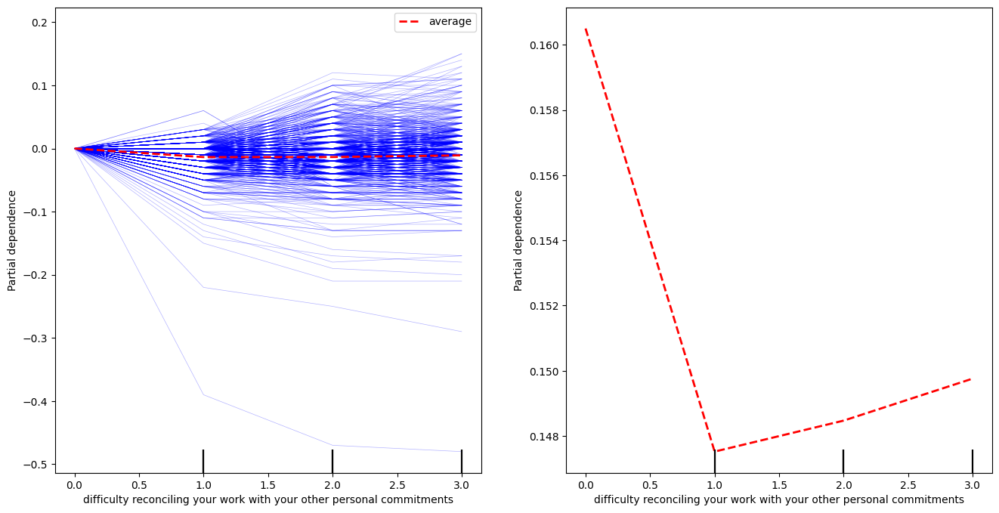

transportation
['Less than 1 hour per day', 'Between 1 hour and 2 hours per day', 'From 2 hours to 3 hours per day', 'More than 3 hours per day']
Categories (4, object): ['Less than 1 hour per day' < 'Between 1 hour and 2 hours per day' < 'From 2 hours to 3 hours per day' < 'More than 3 hours per day']


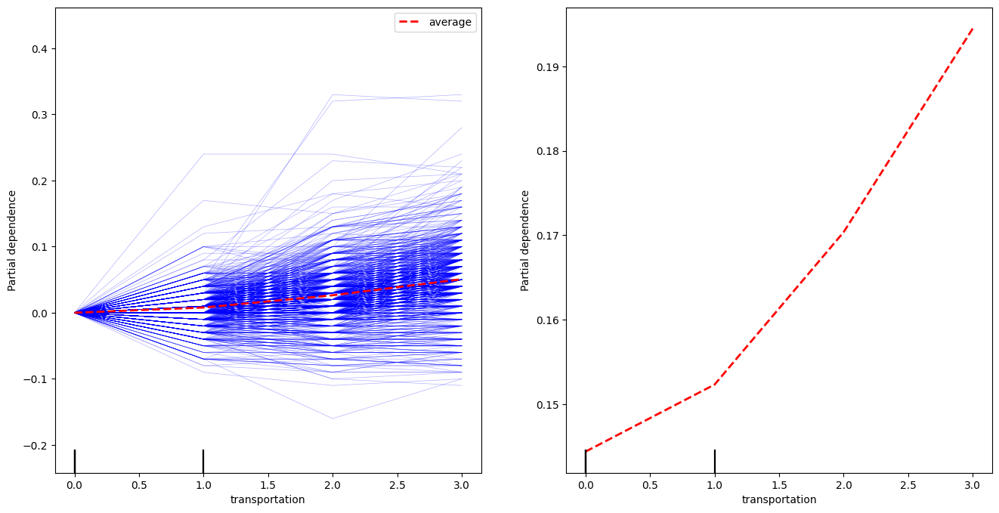

personal concerns
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


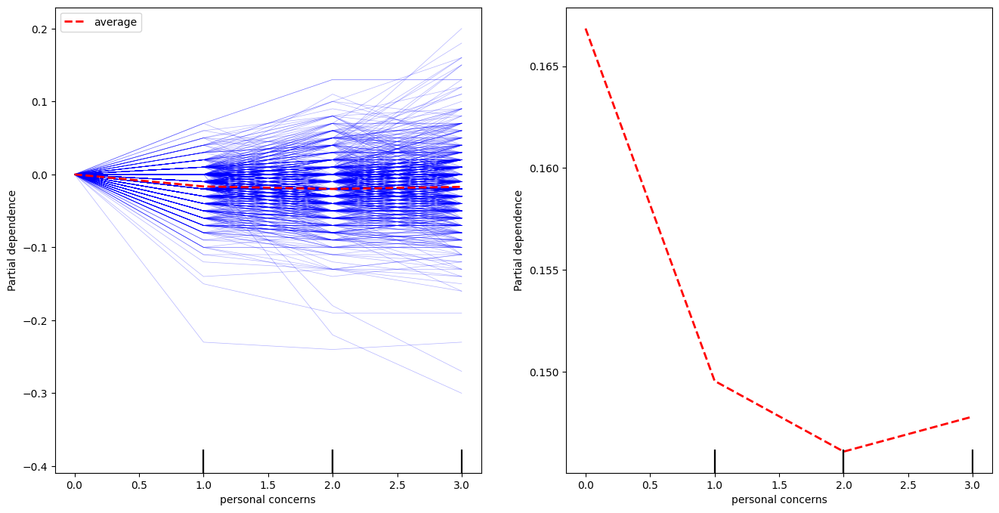

can talk to loved ones
['Completely', 'Rather', 'Rather not', 'Not at all']
Categories (4, object): ['Completely' < 'Rather' < 'Rather not' < 'Not at all']


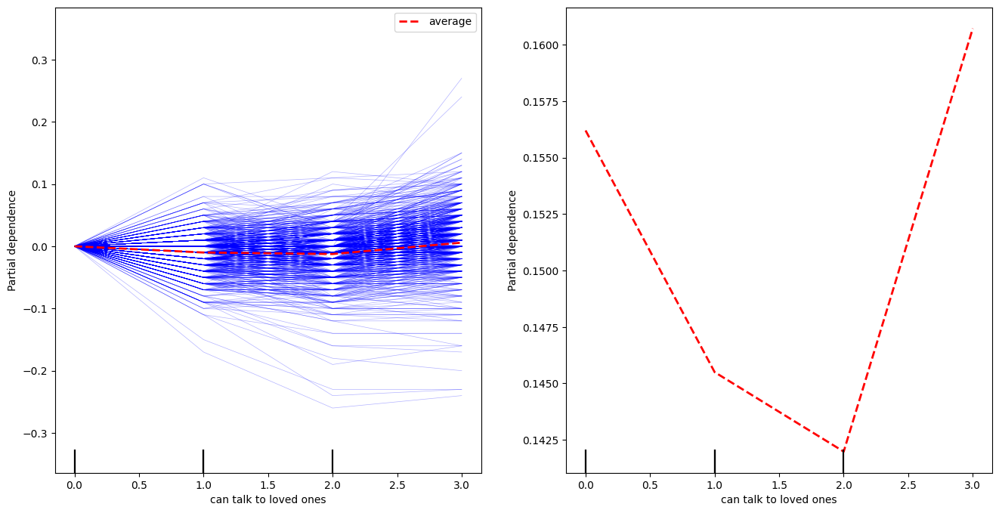

state of health in general
['Very good', 'Good', 'AVERAGE', 'Bad', 'Very bad']
Categories (5, object): ['Very good' < 'Good' < 'AVERAGE' < 'Bad' < 'Very bad']


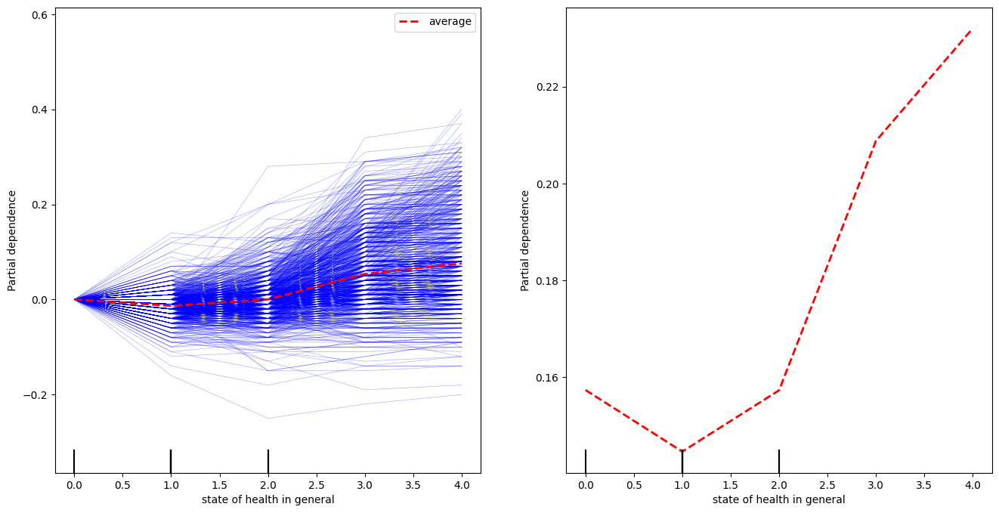

long-term illness
['Yes', 'No']
Categories (2, object): ['Yes', 'No']


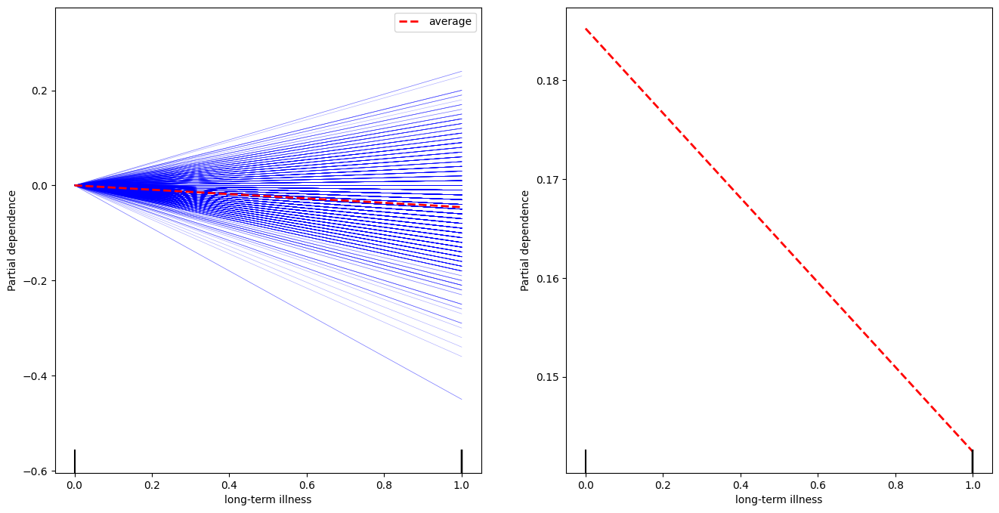

Disabilities
['Yes', 'No']
Categories (2, object): ['Yes', 'No']


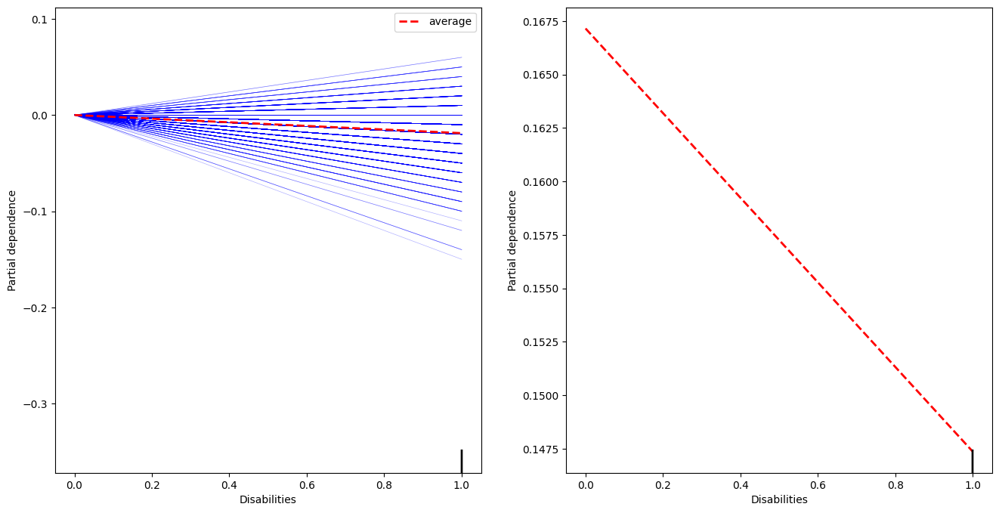

Headaches
['Never', 'Sometimes', 'Often', 'Permanently']
Categories (4, object): ['Never' < 'Sometimes' < 'Often' < 'Permanently']


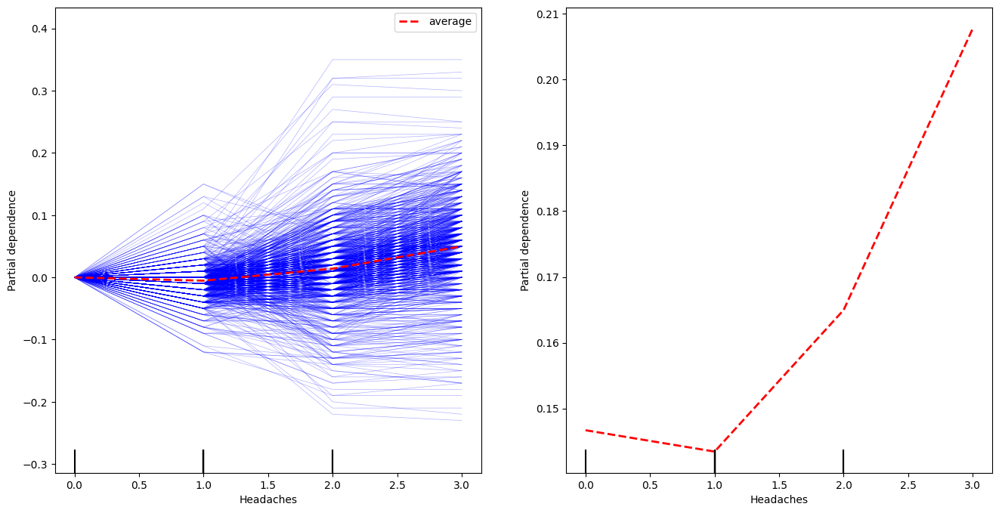

neck, shoulder, arm pain
['Never', 'Sometimes', 'Often', 'Permanently']
Categories (4, object): ['Never' < 'Sometimes' < 'Often' < 'Permanently']


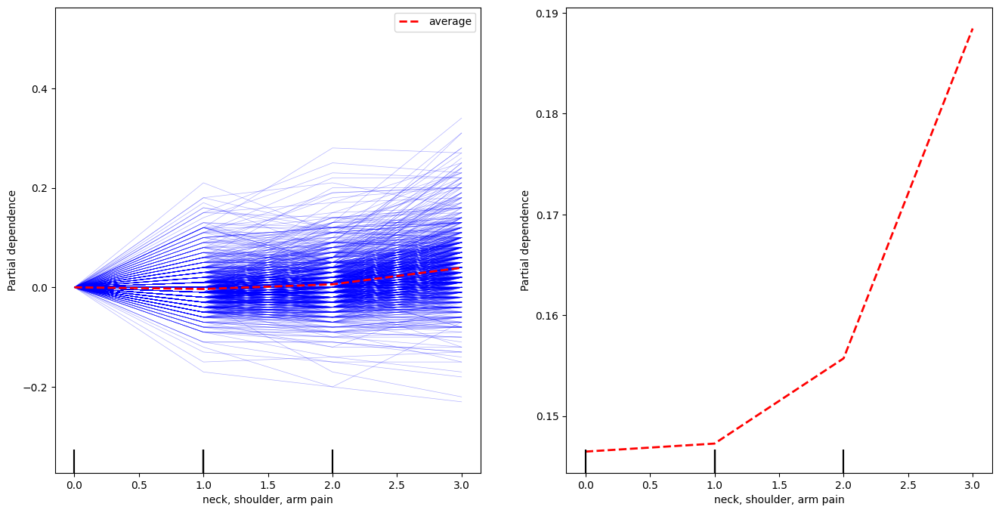

back pain
['Never', 'Sometimes', 'Often', 'Permanently']
Categories (4, object): ['Never' < 'Sometimes' < 'Often' < 'Permanently']


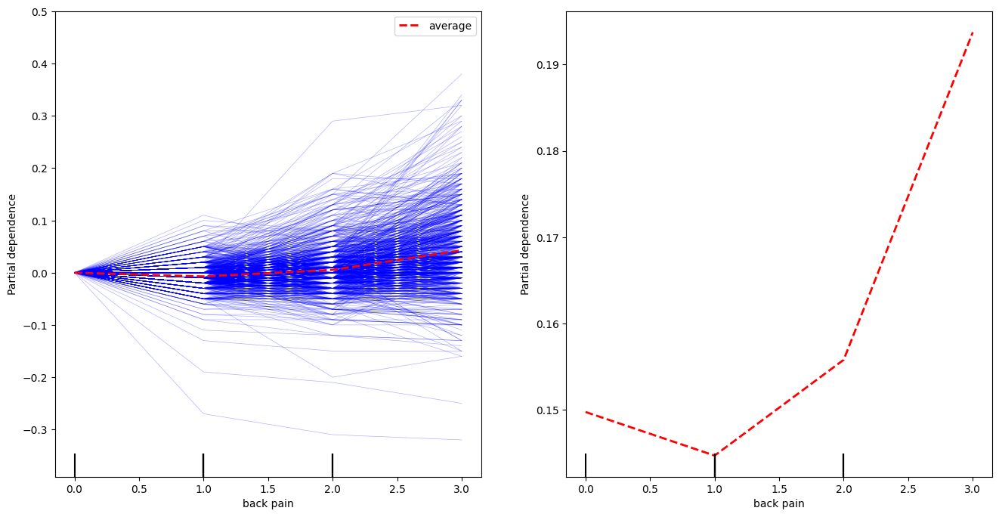

leg, foot, knee pain
['Never', 'Sometimes', 'Often', 'Permanently']
Categories (4, object): ['Never' < 'Sometimes' < 'Often' < 'Permanently']


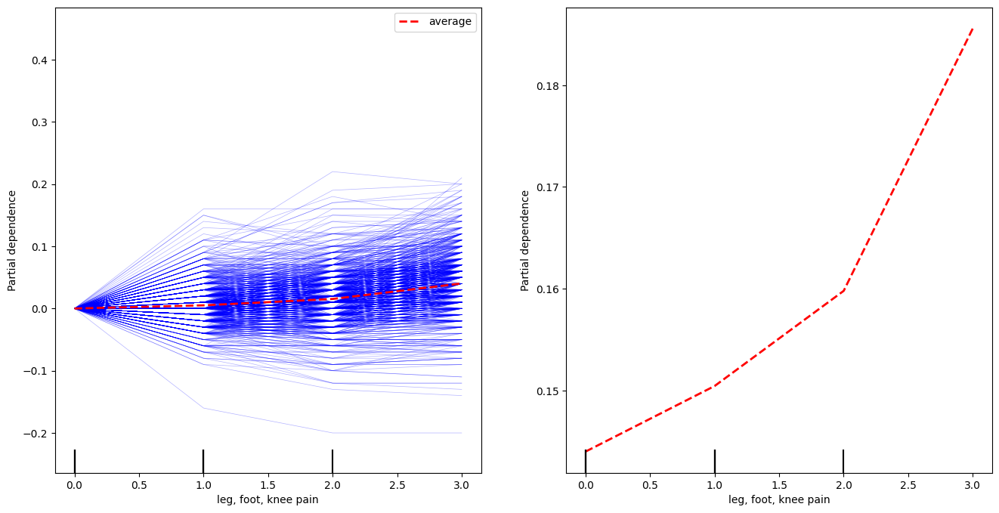

other parts of the body pain
['Never', 'Sometimes', 'Often', 'Permanently']
Categories (4, object): ['Never' < 'Sometimes' < 'Often' < 'Permanently']


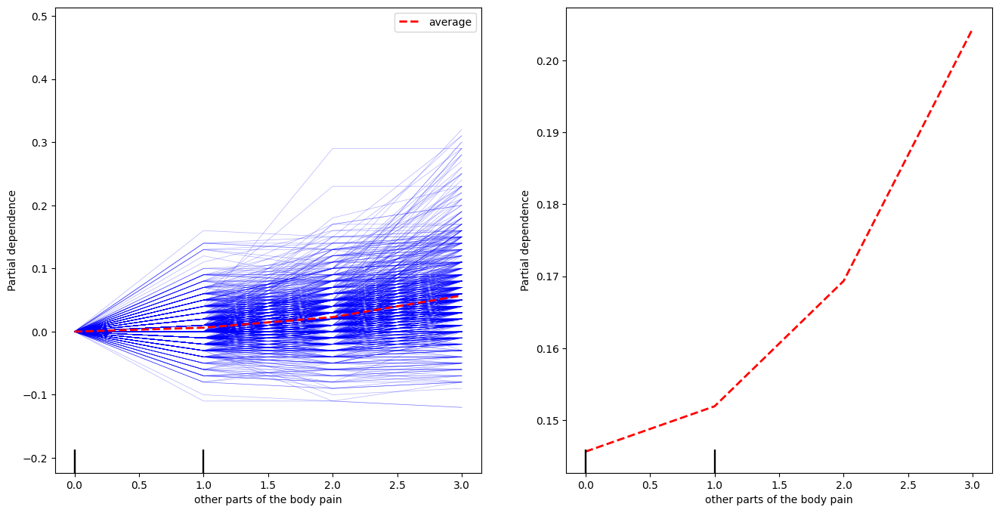

midday meal
['In the canteen or company restaurant', 'By bringing your meal from home', 'While eating a sandwich', 'When going to a restaurant, brasserie, snack ..., 'When returning home']
Categories (5, object): ['In the canteen or company restaurant', 'By bringing your meal from home', 'While eating a sandwich', 'When going to a restaurant, brasserie, snack ..., 'When returning home']


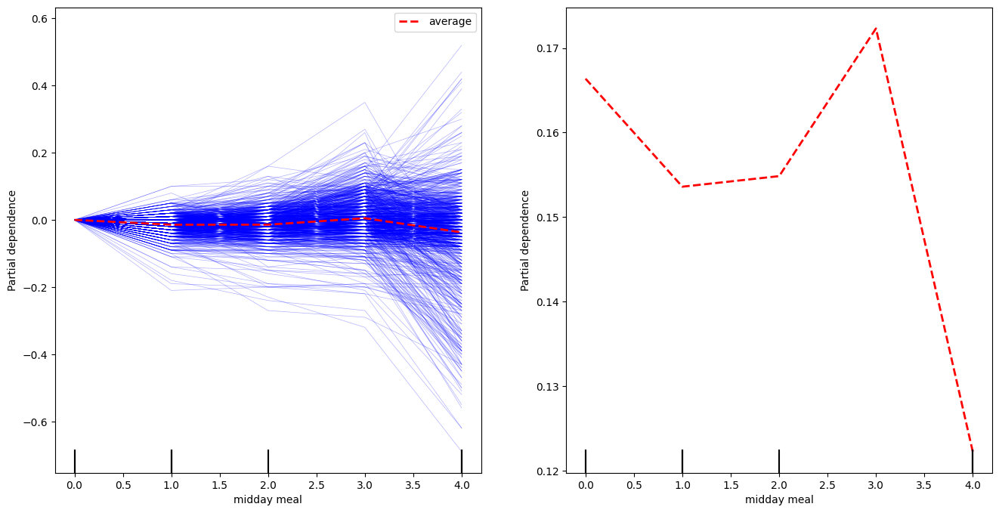

drinks (At least once a week)
['Sodas', 'Alcoholic beverages', 'Energy drinks (like Red Bull or Monster)']
Categories (3, object): ['Sodas', 'Alcoholic beverages', 'Energy drinks (like Red Bull or Monster)']


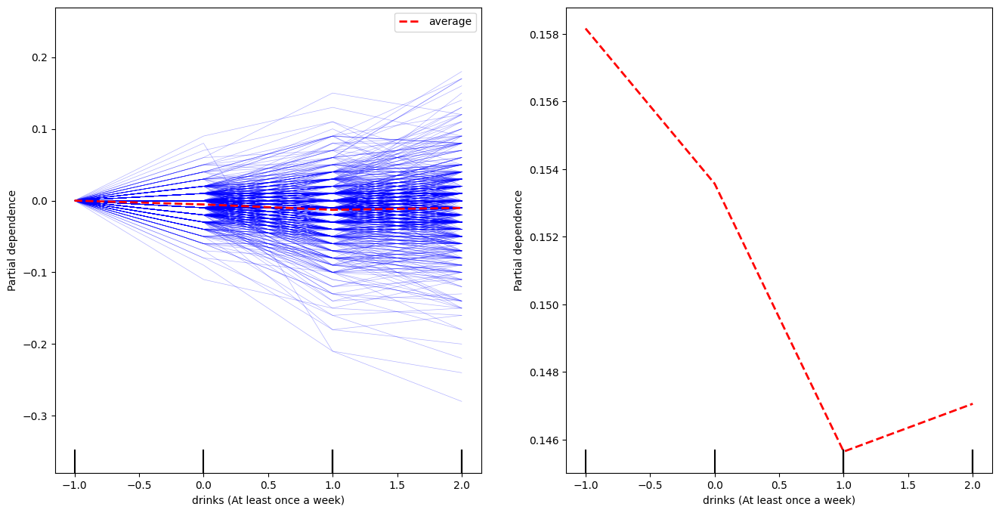

smoker
['Yes', 'No']
Categories (2, object): ['Yes', 'No']


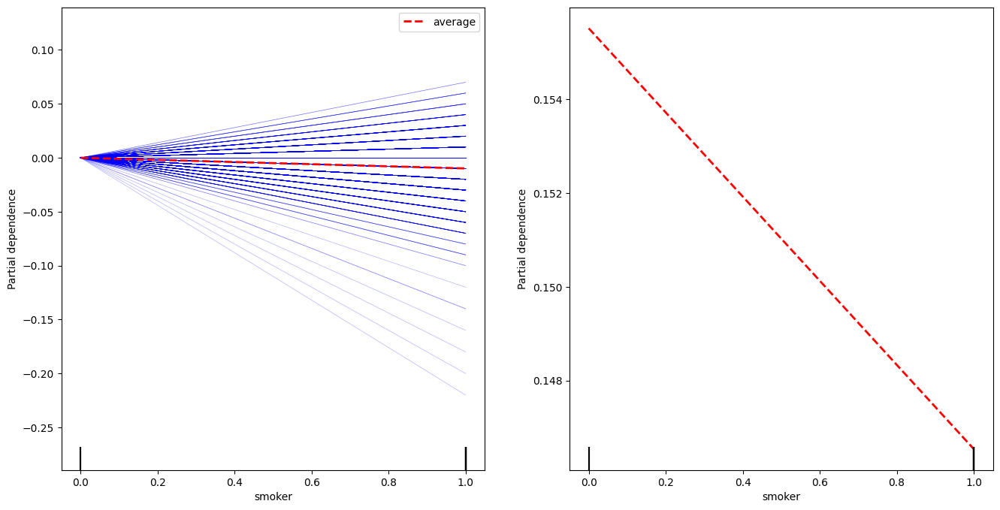

sleeping pills, anxiolytics or anti-depressants
['Never', 'Less than once a month', 'Once a month', 'Several times a month', 'At least once a week']
Categories (5, object): ['Never' < 'Less than once a month' < 'Once a month' < 'Several times a month' < 'At least once a week']


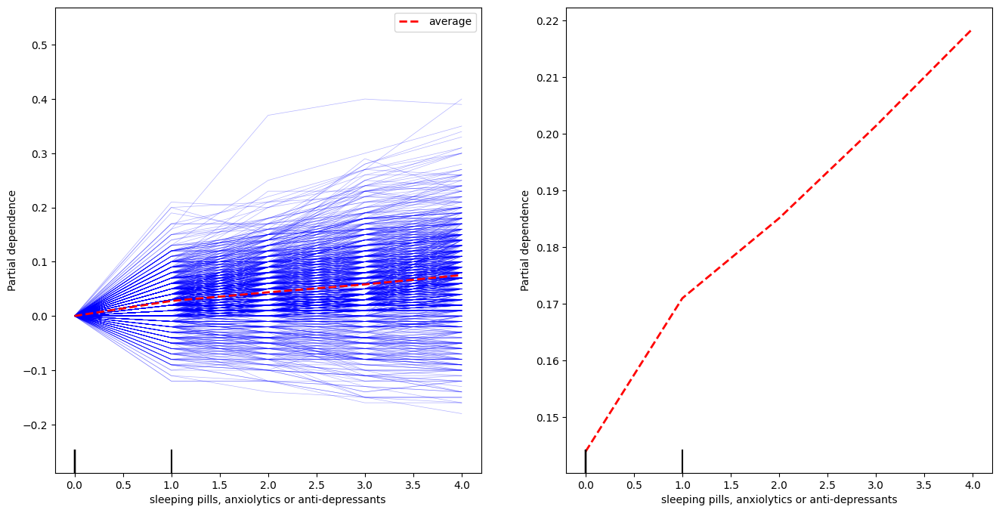

Sleep disorders
['Never', 'sometimes', 'often', 'permanently']
Categories (4, object): ['Never' < 'sometimes' < 'often' < 'permanently']


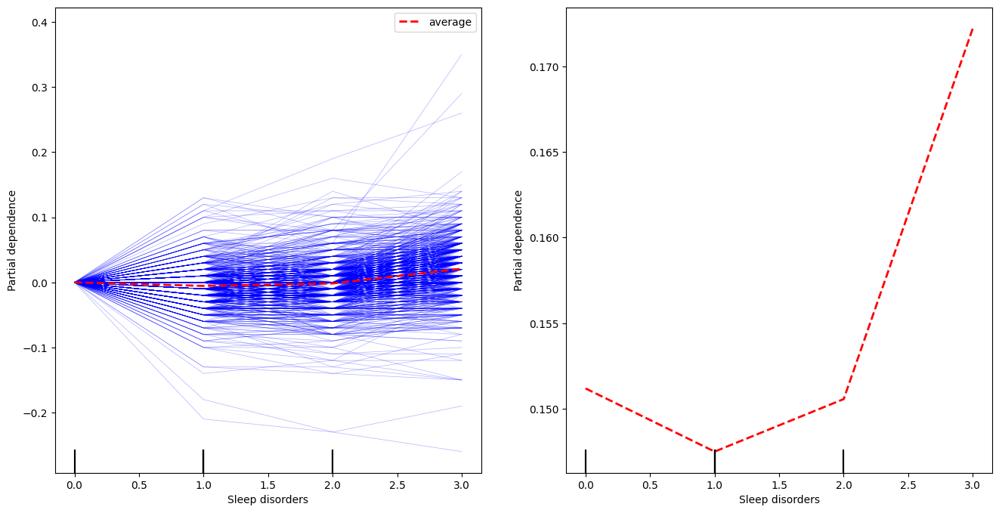

lack of tone
['Never', 'sometimes', 'often', 'permanently']
Categories (4, object): ['Never' < 'sometimes' < 'often' < 'permanently']


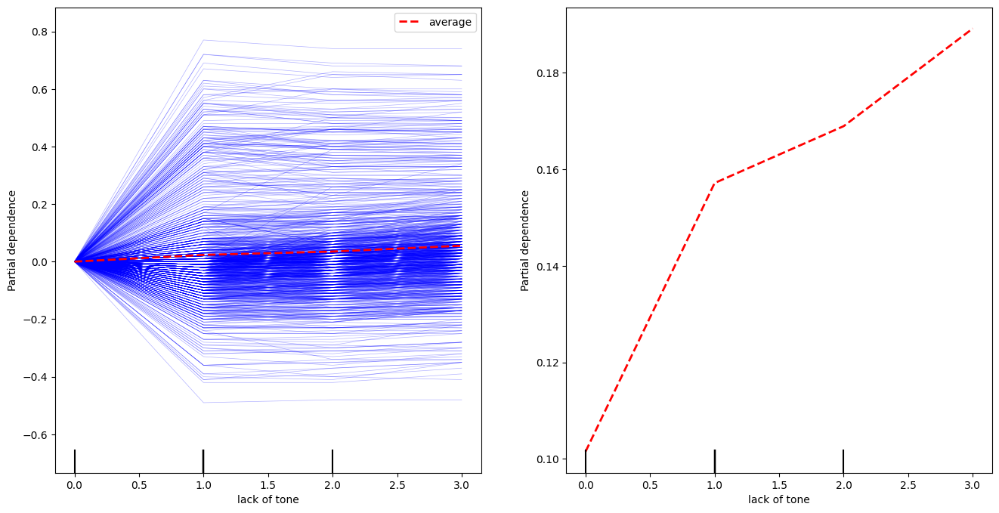

In [16]:
for i in X_train.columns:
    print(i)
    if i in cat_codes:
        print(cat_codes[i])

    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(16,8))
    PartialDependenceDisplay.from_estimator(rf, X_train, features=[i], 
                                            kind='both',
                                            centered=True,
                                            ice_lines_kw={"color":"blue"},
                                            pd_line_kw={"color":"red","lw":2, "linestyle":"--"},
                                            ax=ax1)
    PartialDependenceDisplay.from_estimator(rf, X_train, features=[i], 
                                            kind='average',
                                            ice_lines_kw={"color":"blue"},
                                            pd_line_kw={"color":"red","lw":2, "linestyle":"--"},
                                            ax=ax2)
    # if i has a / in it, change it to _
    i = i.replace('/', '_')
    plt.savefig(f'outputs/03_01_ice_pdp/{i}_ice_pdp_plot.png')
    plt.show()